In [1]:
import os
import time
import sys
import pandas as pd
import numpy as np
from scipy.spatial import cKDTree, distance_matrix, ConvexHull
from scipy.spatial.distance import pdist, squareform
import umap
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

2025-05-06 12:08:15.540031: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-06 12:08:17.861091: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# move to base directory
if os.path.basename(os.getcwd()) == "STmic":
    pass
else:
    os.chdir("../")

print(f"current directory: {os.getcwd()}")

current directory: /gpfs/commons/home/ikothari/STmic


In [3]:
# functions for building/subsetting different geometries from barcode arrays
from scripts.py.utils_geometry import *
# functions for simulating the molecular assay
from scripts.py.utils_simulation import *
# functions for building and assessing reconstructions
from scripts.py.utils_reconstruction import *

In [4]:
centers = np.load("/gpfs/commons/home/ikothari/STmic/notebooks/output/1umcenters.npy", allow_pickle=True)

In [5]:
#convert the center to a dataframe
bc_map = pd.DataFrame(centers, columns=['x', 'y'])
print(bc_map.head())
bc_map['x_y'] = bc_map['x'] * bc_map['y']


            x           y
0  240.314578  249.712723
1  254.535911  134.102051
2   81.976166  138.203032
3  279.261804   37.959083
4  102.010661   55.310494


In [6]:
from scripts.py.utils_geometry import subset_points_within_star, subset_points_within_circle, subset_points_within_regular_polygon

star = subset_points_within_star(bc_map, 75, 150, 5)
star.reset_index(inplace=True)

circle = subset_points_within_circle(bc_map, 150)
circle.reset_index(inplace=True)

square = subset_points_within_regular_polygon(bc_map, 4, 150)
square.reset_index(inplace=True)



In [7]:
params_dict = {}

mers_values = [25]
reaction_time = [1]
num_reads_values = [50]

for i in range(len(mers_values)):
    for j in range(len(num_reads_values)):
        for k in range(len(reaction_time)):
            params_dict[f"{i}_{j}_{k}"] = {
                "mers_per_molc": mers_values[i],
                "num_reads": num_reads_values[j],
                "reaction_time": reaction_time[k],
                "plot": False,
            }

print(f"Testing {len(params_dict)} variations...")
print(num_reads_values)

Testing 1 variations...
[50]


In [8]:
print("Total Reads: ", num_reads_values[0] * len(star))

Total Reads:  106700


In [9]:
dist_matrix = build_distance_matrix(star)
for keys, params in params_dict.items():
        print(params)
        tally_matrix = simulate_concatemerization(
            bc_map=star, dist_matrix=dist_matrix, params=params,verbose=True
        )
        tally_matrix.setdiag(0)
        psuedo_distance_matrix = compute_pseudo_distance(tally_matrix)
        tally_umap = umap_driver(
            psuedo_distance_matrix, n_neighbors=75, min_dist=0.99, metric="euclidean",verbose=True
        )
        star["umap_1"] = pd.DataFrame(tally_umap)[0]
        star["umap_2"] = pd.DataFrame(tally_umap)[1]
        error, error_list = localreconstruction_KNN(star,15)

{'mers_per_molc': 25, 'num_reads': 50, 'reaction_time': 1, 'plot': False}
Compute noise matrix
Add noise to distance matrix


STARTING ACCUMULATION
FINISHED
Max interactions:  58,220.0
Total self-interactions: 812,056.0
Ratio of self-interactions to total interactions: 0.63%


/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(min_dist=0.99, n_epochs=1000, n_jobs=1, n_neighbors=75, random_state=42, verbose=True)
Tue May  6 12:09:20 2025 Construct fuzzy simplicial set
Tue May  6 12:09:30 2025 Finding Nearest Neighbors
Tue May  6 12:09:32 2025 Finished Nearest Neighbor Search
Tue May  6 12:09:34 2025 Construct embedding


Epochs completed:   0%|            0/1000 [00:00]

	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  300  /  1000 epochs
	completed  400  /  1000 epochs
	completed  500  /  1000 epochs
	completed  600  /  1000 epochs
	completed  700  /  1000 epochs
	completed  800  /  1000 epochs
	completed  900  /  1000 epochs
Tue May  6 12:09:45 2025 Finished embedding


/scratch/ipykernel_202397/3760954760.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star["umap_1"] = pd.DataFrame(tally_umap)[0]
/scratch/ipykernel_202397/3760954760.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star["umap_2"] = pd.DataFrame(tally_umap)[1]


In [10]:
dist_matrix = build_distance_matrix(square)
for keys, params in params_dict.items():
        print(params)
        tally_matrix = simulate_concatemerization(
            bc_map=square, dist_matrix=dist_matrix, params=params,verbose=True
        )
        tally_matrix.setdiag(0)
        psuedo_distance_matrix = compute_pseudo_distance(tally_matrix)
        tally_umap = umap_driver(
            psuedo_distance_matrix, n_neighbors=75, min_dist=0.99, metric="euclidean",verbose=True
        )
        square["umap_1"] = pd.DataFrame(tally_umap)[0]
        square["umap_2"] = pd.DataFrame(tally_umap)[1]
        error, error_list = localreconstruction_KNN(square,15)

{'mers_per_molc': 25, 'num_reads': 50, 'reaction_time': 1, 'plot': False}
Compute noise matrix
Add noise to distance matrix
STARTING ACCUMULATION
FINISHED
Max interactions:  39,552.0
Total self-interactions: 558,668.0
Ratio of self-interactions to total interactions: 0.64%
UMAP(min_dist=0.99, n_epochs=1000, n_jobs=1, n_neighbors=75, random_state=42, verbose=True)
Tue May  6 12:10:07 2025 Construct fuzzy simplicial set


/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Tue May  6 12:10:10 2025 Finding Nearest Neighbors
Tue May  6 12:10:10 2025 Finished Nearest Neighbor Search
Tue May  6 12:10:10 2025 Construct embedding


Epochs completed:   0%|            0/1000 [00:00]

	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  300  /  1000 epochs
	completed  400  /  1000 epochs
	completed  500  /  1000 epochs
	completed  600  /  1000 epochs
	completed  700  /  1000 epochs
	completed  800  /  1000 epochs
	completed  900  /  1000 epochs
Tue May  6 12:10:18 2025 Finished embedding


/scratch/ipykernel_202397/3134913351.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  square["umap_1"] = pd.DataFrame(tally_umap)[0]
/scratch/ipykernel_202397/3134913351.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  square["umap_2"] = pd.DataFrame(tally_umap)[1]


/scratch/ipykernel_1708986/103514463.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['error'] = error_list
/scratch/ipykernel_1708986/103514463.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = (star['umap_1'] - star['umap_1'].min()) / (star['umap_1'].max() - star['umap_1'].min())
/scratch/ipykernel_1708986/103514463.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

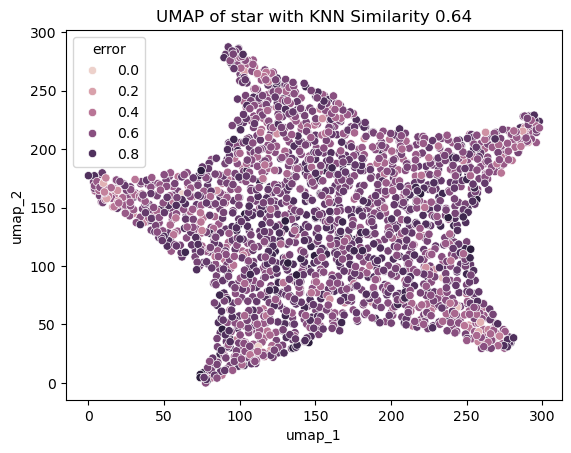

0.6415807560137458


In [65]:
star['error'] = error_list
#normalize and then scale umap to 300 x 300
star['umap_1'] = (star['umap_1'] - star['umap_1'].min()) / (star['umap_1'].max() - star['umap_1'].min())
star['umap_2'] = (star['umap_2'] - star['umap_2'].min()) / (star['umap_2'].max() - star['umap_2'].min())
star['umap_1'] = star['umap_1'] * star['x'].max()
star['umap_2'] = star['umap_2'] * star['y'].max()

sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='error')
plt.title(f"UMAP of star with KNN Similarity {error:.2f}")
plt.show()
print(error)



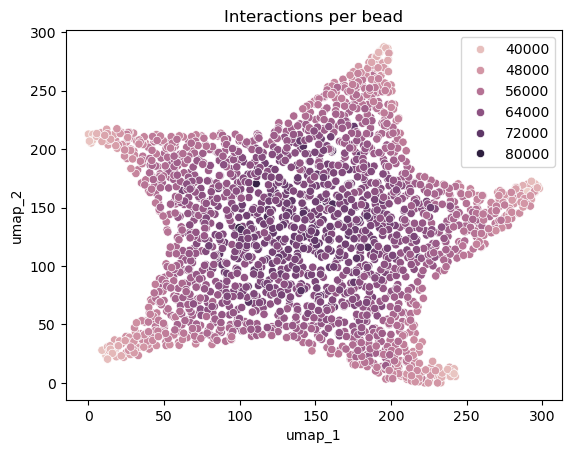

In [11]:
interactions = tally_matrix.sum(axis=0).A1  # Convert sparse matrix to a 1D array
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue=interactions)
plt.title("Interactions per bead")
plt.show()


## Testing Matching to Mask Using OT

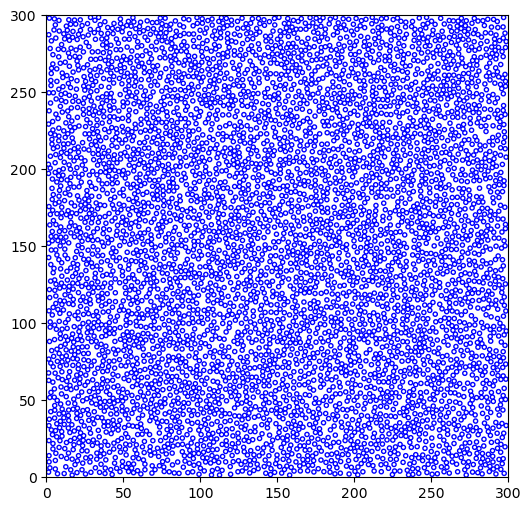

In [12]:
import matplotlib.pyplot as plt
mask_centers = generate_array(0.76,300,300,2.7)


In [13]:
bc_map_mask = pd.DataFrame(mask_centers, columns=['x', 'y'])
star_mask = subset_points_within_star(bc_map_mask, 75, 150, 5)
star_mask.reset_index(inplace=True)
print(star_mask.head())

   level_0  index           x           y
0        0      4  257.820391  162.081711
1        1      5  108.470937   78.077154
2        2      6  189.203275  118.715161
3        3     10  163.243047  211.273470
4        4     12  191.763672  188.248310


In [11]:
#generate star mask by shuffling the points in star 
star_mask = star.sample(frac=1).reset_index(drop=True)
square_mask = square.sample(frac=1).reset_index(drop=True)

# Testing Semi Supervised t-SNE 

In [15]:
interaction_matrix = tally_matrix
psuedo_distance_matrix = compute_pseudo_distance(interaction_matrix)

pseudo_distance_matrix = psuedo_distance_matrix.todense()
distances_pseudo = np.array(pseudo_distance_matrix)
#save the distances_pseudo
np.save("distances_pseudo.npy", distances_pseudo)

distances_mask = squareform(pdist(star_mask[['x', 'y']].values))
np.save("distances_mask.npy", distances_mask)

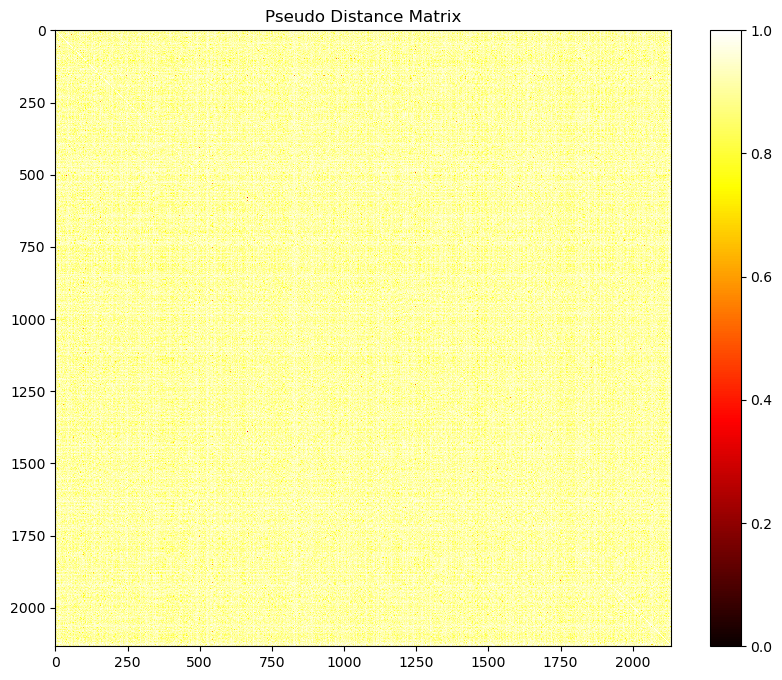

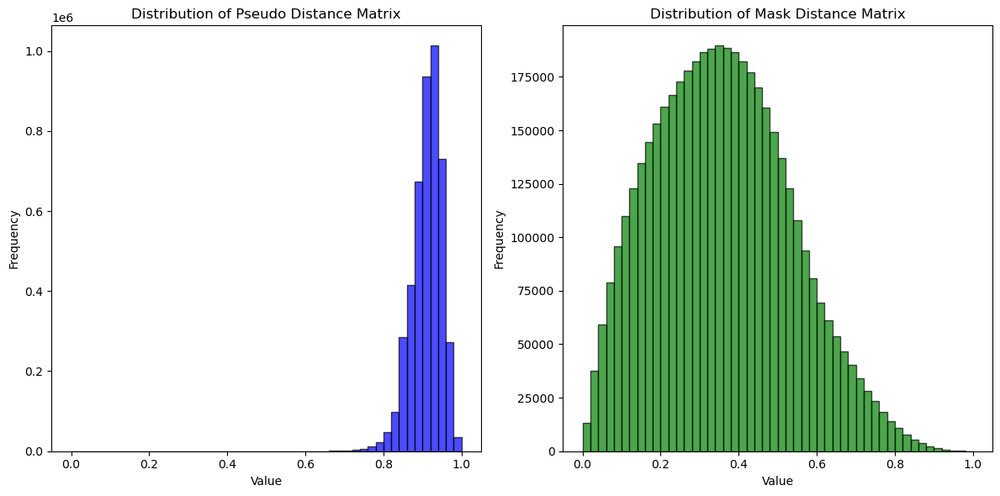

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform



# --- 2. Visualize the pseudo-distance matrix ---
plt.figure(figsize=(10, 8))
plt.imshow(distances_pseudo, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title("Pseudo Distance Matrix")
plt.show()


distances_mask = squareform(pdist(star_mask[['x', 'y']].values))

# Normalize distances_mask
distances_mask = (distances_mask - np.min(distances_mask)) / (np.max(distances_mask) - np.min(distances_mask))
#zeroes out the diagonal
np.fill_diagonal(distances_mask, 0)

# --- 4. Plot Histograms to Compare ---
pseudo_flat = distances_pseudo.flatten()
mask_flat = distances_mask.flatten()

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(pseudo_flat, bins=50, alpha=0.7, color='blue', edgecolor='black')
plt.title("Distribution of Pseudo Distance Matrix")
plt.xlabel("Value")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(mask_flat, bins=50, alpha=0.7, color='green', edgecolor='black')
plt.title("Distribution of Mask Distance Matrix")
plt.xlabel("Value")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


In [17]:
# Step 1: Flatten
pseudo_flat = distances_pseudo.flatten()
mask_flat = distances_mask.flatten()

#normalize both using log1p
pseudo_flat = np.log1p(pseudo_flat)
mask_flat = np.log1p(mask_flat)


# Step 2: Sort both arrays
pseudo_sorted = np.sort(pseudo_flat)
mask_sorted = np.sort(mask_flat)

# Step 3: Create CDFs
pseudo_cdf = np.linspace(0, 1, len(pseudo_sorted))
mask_cdf = np.linspace(0, 1, len(mask_sorted))

# Step 4: Interpolate

pseudo_quantiles = np.interp(pseudo_flat, pseudo_sorted, pseudo_cdf)

# Then: map those quantiles to mask values
mapped_flat = np.interp(pseudo_quantiles, mask_cdf, mask_sorted)

# Step 5: Reshape
mapped_distance_matrix = mapped_flat.reshape(distances_pseudo.shape)

print("Mapped matrix shape:", mapped_distance_matrix.shape)


Mapped matrix shape: (2134, 2134)


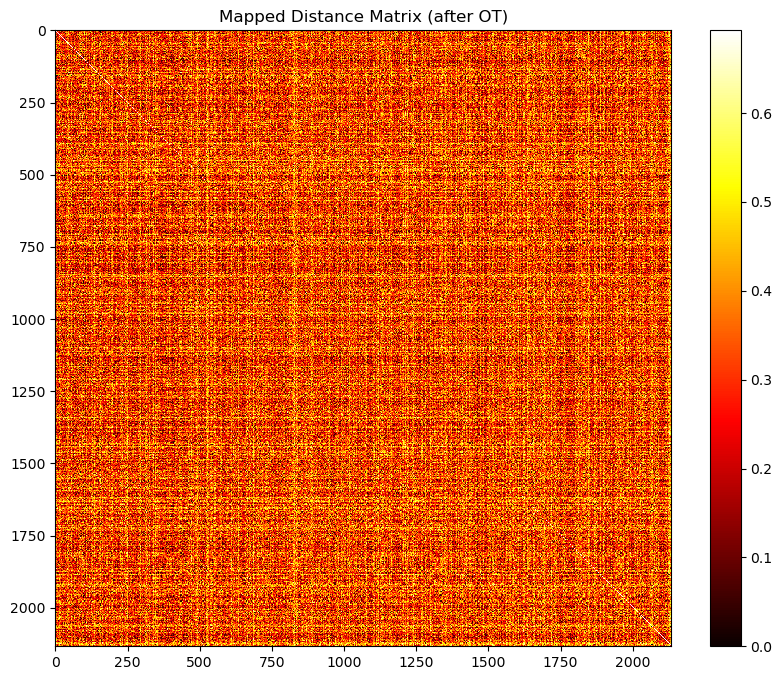

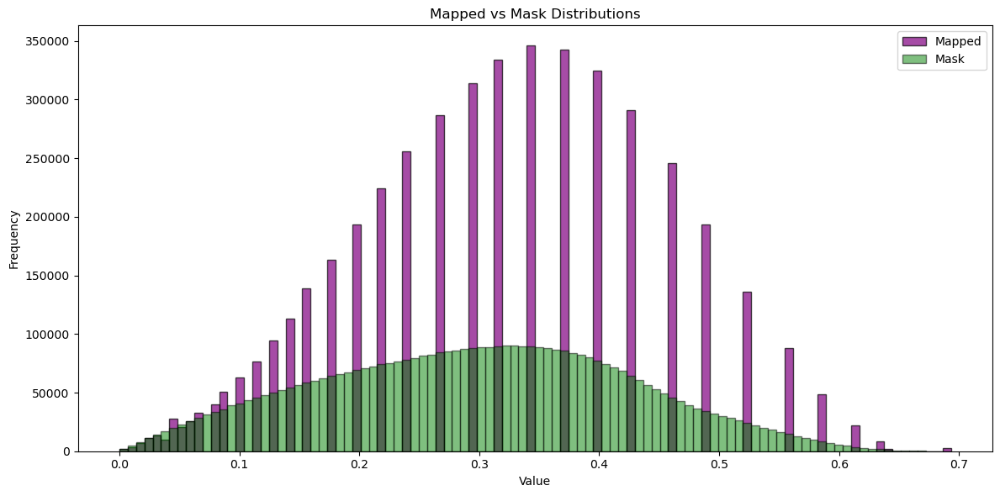

In [18]:
plt.figure(figsize=(10,8))
plt.imshow(mapped_distance_matrix, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title("Mapped Distance Matrix (after OT)")
plt.show()

# Compare distributions
plt.figure(figsize=(12,6))
plt.hist(mapped_distance_matrix.flatten(), bins=100, alpha=0.7, color='purple', edgecolor='black', label='Mapped')
plt.hist(mask_flat, bins=100, alpha=0.5, color='green', edgecolor='black', label='Mask')
plt.legend()
plt.title("Mapped vs Mask Distributions")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


Create pseudodistance matrix using interaction_matrix and then match it to mask to reflect density

In [19]:
distance_matrix = build_distance_matrix(star)
embeddings = umap_driver(distance_matrix)
star["umap_1"] = pd.DataFrame(embeddings)[0]
star["umap_2"] = pd.DataFrame(embeddings)[1]
error, error_list = localreconstruction_KNN(star,15)

/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ipykernel_1708986/37706069.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star["umap_1"] = pd.DataFrame(embeddings)[0]
/scratch/ipykernel_1708986/37706069.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

0.8408309903155264


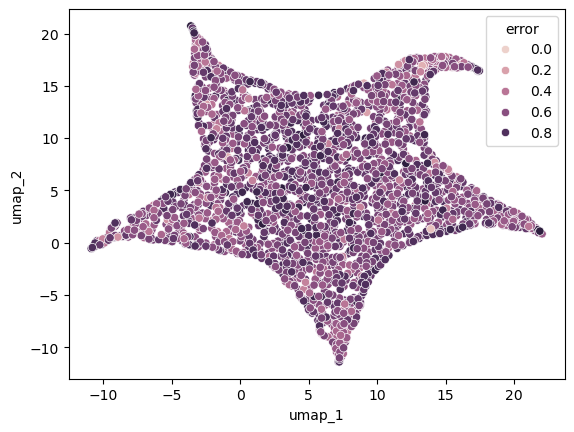

In [20]:
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='error')
print(error)

/scratch/ipykernel_1708986/1423346175.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['cluster'] = kmeans.labels_


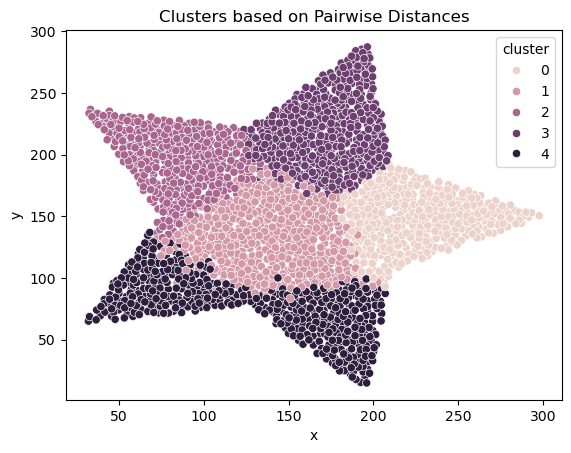

/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ipykernel_1708986/1423346175.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = embedding[:, 0]
/scratch/ipykernel_1708986/1423346175.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

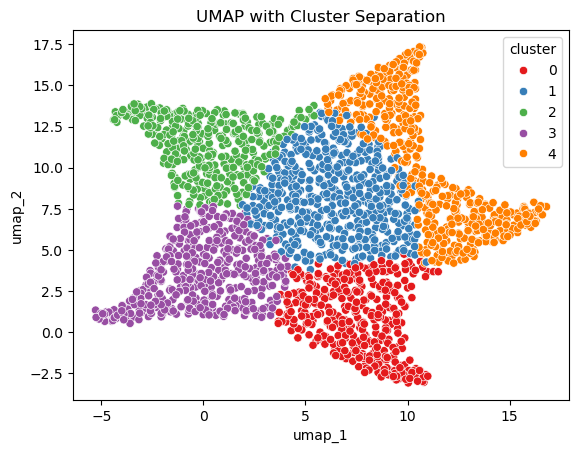

In [21]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import umap
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.preprocessing import StandardScaler

# 1. Convert interaction matrix to dense
interaction_matrix = np.array(tally_matrix.todense())
star_copy = star.copy()

pseudo_distance_matrix = compute_pseudo_distance(interaction_matrix)
pseudo_distance_matrix = np.asarray(pseudo_distance_matrix)

# 3. Perform clustering (KMeans or DBSCAN) on the distance matrix
kmeans = KMeans(n_clusters=5, random_state=0).fit(interaction_matrix)
star['cluster'] = kmeans.labels_

# 4. Visualize initial clusters
sns.scatterplot(x='x', y='y', data=star, hue='cluster')
plt.title("Clusters based on Pairwise Distances")
plt.show()



umap_model = umap.UMAP(n_neighbors=75,  
                       min_dist=0.99,  
                       metric='euclidean', 
                       init='spectral',  
                       random_state=42)

embedding = umap_model.fit_transform(pseudo_distance_matrix)

# 7. Save and plot the UMAP embedding
star['umap_1'] = embedding[:, 0]
star['umap_2'] = embedding[:, 1]

# 8. Visualize UMAP embedding with distinct cluster separation
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='cluster', palette="Set1")
plt.title("UMAP with Cluster Separation")
plt.show()


In [22]:
error , error_list = localreconstruction_KNN(star,15)
print(error)


0.6463605123398938


/scratch/ipykernel_1708986/3063402033.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['cluster'] = kmeans.labels_


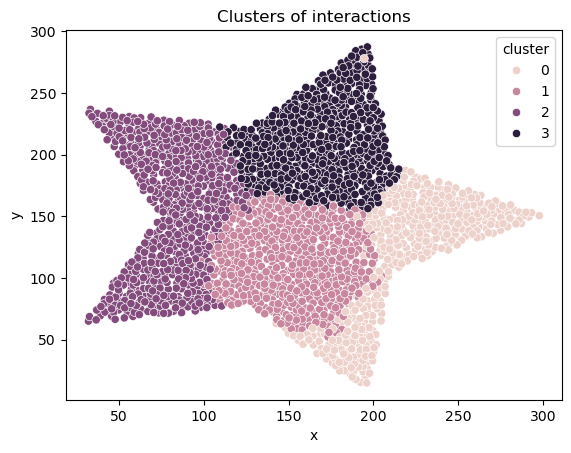

/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


/scratch/ipykernel_1708986/3063402033.py:62: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['tsne_1'] = embedding[:, 0]
/scratch/ipykernel_1708986/3063402033.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['tsne_2'] = embedding[:, 1]


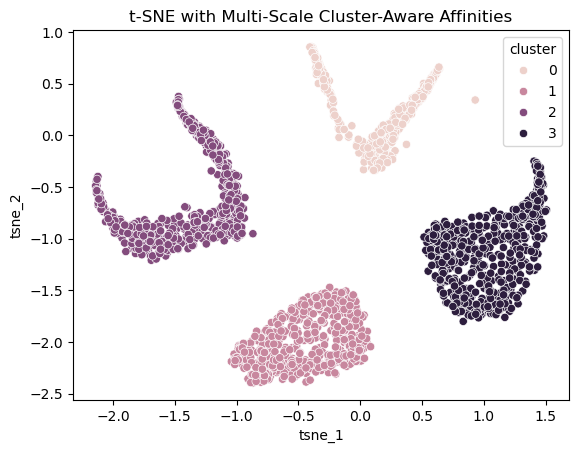

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

# 1. Convert interaction matrix to dense
interaction_matrix = np.array(tally_matrix.todense())
star_copy = star.copy()
#shuffle the points in the star dataframe
star_copy = star_copy.sample(frac=1).reset_index(drop=True)

# 2. Cluster using KMeans
kmeans = KMeans(n_clusters=4, random_state=0).fit(interaction_matrix)
star['cluster'] = kmeans.labels_
pseudo_labels = kmeans.labels_

# 3. Plot initial clusters
sns.scatterplot(x='x', y='y', data=star, hue='cluster')
plt.title("Clusters of interactions")
plt.show()

# 4. Compute pairwise distances
# distances = build_distance_matrix(star)
# distances = psuedo_distance_matrix.todense()
# distances = np.array(distances)
distances = mapped_distance_matrix

# 5. Create multi-scale affinity matrices
scales = [0.1, 1, 10]
n = len(star)
affinity_matrix_multiscale = np.zeros((n, n, len(scales)))

for idx, scale in enumerate(scales):
    affinity = np.exp(-distances / scale) / (2 * scale ** 2)
    affinity /= affinity.sum(axis=1, keepdims=True)
    affinity_matrix_multiscale[:, :, idx] = affinity


for i in range(n):
    for j in range(n):
        if pseudo_labels[i] == pseudo_labels[j]:
            affinity_matrix_multiscale[i, j, :] *= 1.5
        else:
            affinity_matrix_multiscale[i, j, :] *= 0.5

# 7. Average across scales to get final affinity matrix
final_affinity_matrix = np.mean(affinity_matrix_multiscale, axis=2)

# 8. Apply t-SNE using the affinity matrix as a distance-like input
# (invert affinities to approximate distances; subtract from 1)
distance_like_matrix = 1 - final_affinity_matrix

# Ensure all values in the distance-like matrix are non-negative
distance_like_matrix[distance_like_matrix < 0] = 0

tsne = TSNE(n_iter=1000, perplexity=1500, metric='precomputed', init='random', random_state=0)
embedding = tsne.fit_transform(distance_like_matrix)

# 9. Save and plot embedding
star['tsne_1'] = embedding[:, 0]
star['tsne_2'] = embedding[:, 1]

sns.scatterplot(x='tsne_1', y='tsne_2', data=star, hue='cluster')
plt.title("t-SNE with Multi-Scale Cluster-Aware Affinities")
plt.show()


/scratch/ipykernel_1708986/812377226.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['cluster'] = kmeans.labels_


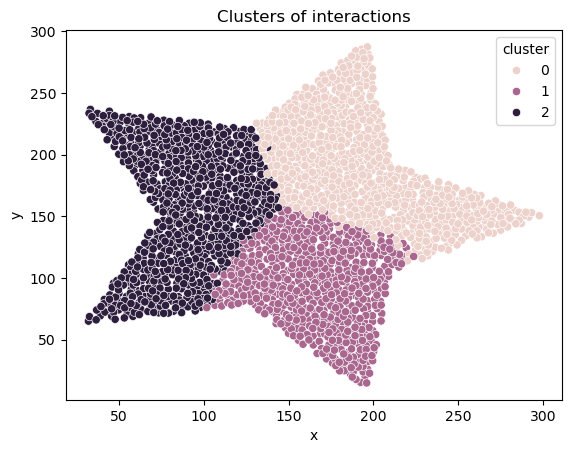

/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1858: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")
/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


/scratch/ipykernel_1708986/812377226.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = embedding[:, 0]
/scratch/ipykernel_1708986/812377226.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_2'] = embedding[:, 1]


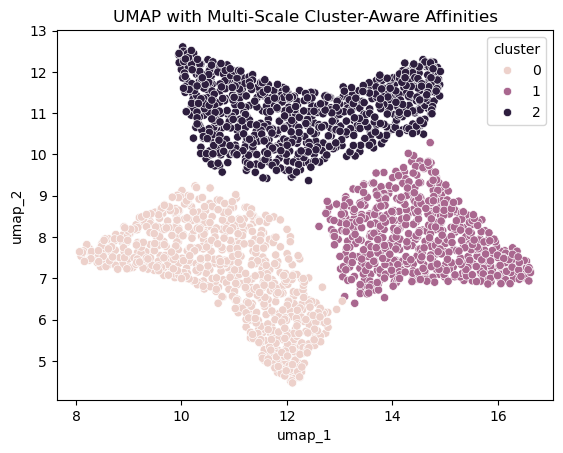

In [24]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import umap
from scipy.sparse import csr_matrix

# 1. Convert interaction matrix to dense
interaction_matrix = np.array(tally_matrix.todense())
star_copy = star.copy()

# Shuffle the points in the star dataframe
star_copy = star_copy.sample(frac=1).reset_index(drop=True)

# 2. Cluster using KMeans
kmeans = KMeans(n_clusters=3, random_state=0).fit(interaction_matrix)
star['cluster'] = kmeans.labels_
pseudo_labels = kmeans.labels_

# 3. Plot initial clusters
sns.scatterplot(x='x', y='y', data=star, hue='cluster')
plt.title("Clusters of interactions")
plt.show()

# 4. Compute pairwise distances
# distances = build_distance_matrix(star)
# distances = pseudo_distance_matrix.todense()
# distances = np.array(distances)
distances = mapped_distance_matrix

# 5. Create multi-scale affinity matrices
scales = [0.1, 1, 10]
n = len(star)
affinity_matrix_multiscale = np.zeros((n, n, len(scales)))

for idx, scale in enumerate(scales):
    affinity = np.exp(-distances / scale) / (2 * scale ** 2)
    affinity /= affinity.sum(axis=1, keepdims=True)
    affinity_matrix_multiscale[:, :, idx] = affinity

# 6. Adjust affinities based on cluster membership
for i in range(n):
    for j in range(n):
        # if pseudo_labels[i] == pseudo_labels[j]:
        #     affinity_matrix_multiscale[i, j, :] *= 1.5
        # else:
        #     affinity_matrix_multiscale[i, j, :] *= 0.5
        affinity_matrix_multiscale[i, j, :] *= (1 + 0.2 * (pseudo_labels[i] == pseudo_labels[j]))


# 7. Average across scales to get final affinity matrix
final_affinity_matrix = np.mean(affinity_matrix_multiscale, axis=2)


distance_like_matrix = 1 - final_affinity_matrix

# Make sure diagonal is exactly zero
np.fill_diagonal(distance_like_matrix, 0)

# Ensure all distances are non-negative
distance_like_matrix[distance_like_matrix < 0] = 0

# Convert to sparse matrix
graph_sparse = csr_matrix(distance_like_matrix)


# 9. Apply UMAP
umap_model = umap.UMAP(
    n_neighbors=50,     # you can tune this
    min_dist=0.3,       # you can tune this too
    metric='precomputed',  
    random_state=0
)
embedding = umap_model.fit_transform(graph_sparse)

# 10. Save and plot embedding
star['umap_1'] = embedding[:, 0]
star['umap_2'] = embedding[:, 1]

sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='cluster')
plt.title("UMAP with Multi-Scale Cluster-Aware Affinities")
plt.show()


In [25]:
star_mask_values = star_mask[['x', 'y']].values
kmeans = KMeans(n_clusters=4, random_state=0).fit(star_mask_values)
star_mask['cluster'] = kmeans.labels_


In [26]:

error, error_list = localreconstruction_KNN(star,15)
print(error)

0.568853483286473


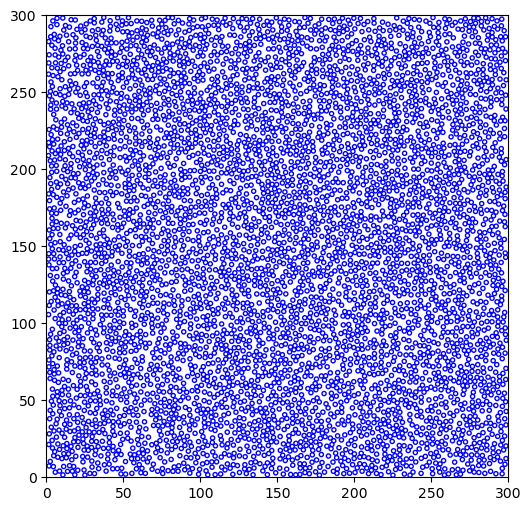

   level_0  index           x           y
0        0      3  253.421768  154.289182
1        1      4  182.966460   45.045850
2        2      5   85.904470  210.760501
3        3      6  202.464257   77.225950
4        4     16  114.510834  112.462259


In [27]:
import matplotlib.pyplot as plt
mask_centers = generate_array(0.76,300,300,2.7)
bc_map_mask = pd.DataFrame(mask_centers, columns=['x', 'y'])
star_mask = subset_points_within_star(bc_map_mask, 75, 150, 5)
#shuffle the star_mask dataframe

star_mask.reset_index(inplace=True)
print(star_mask.head())


In [28]:
print(star_mask.head())

   level_0  index           x           y
0        0      3  253.421768  154.289182
1        1      4  182.966460   45.045850
2        2      5   85.904470  210.760501
3        3      6  202.464257   77.225950
4        4     16  114.510834  112.462259


In [29]:
target = star_mask[['x', 'y']].values
target = np.array(target)
source = star[['umap_1', 'umap_2']].values
source = np.array(source)





/scratch/ipykernel_1708986/3584488601.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['mapped_x'] = mapped_points[:, 0]
/scratch/ipykernel_1708986/3584488601.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['mapped_y'] = mapped_points[:, 1]


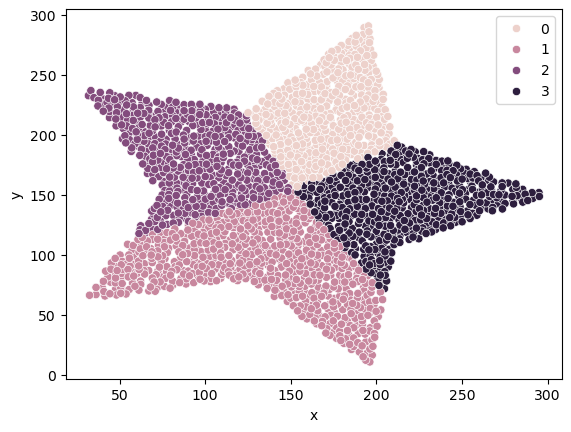

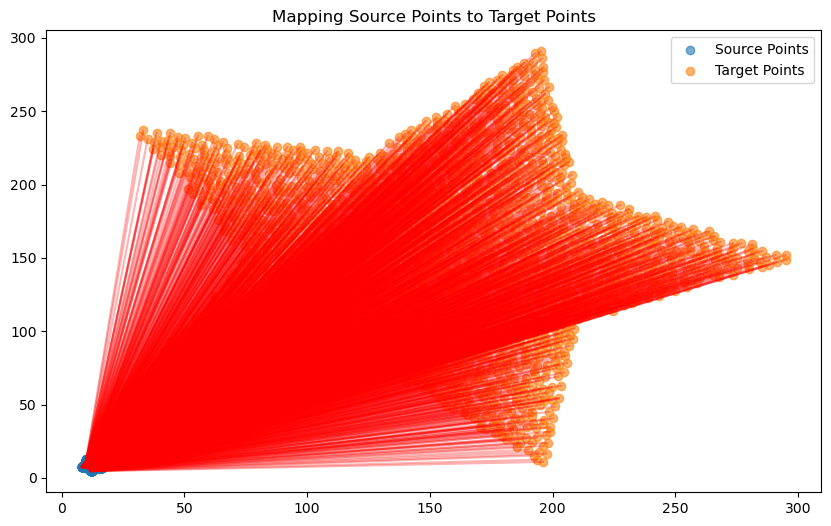

In [32]:
import ot
from scipy.spatial.distance import cdist

# Compute the cost matrix
C = cdist(source, target, 'sqeuclidean')

# Normalize the distributions to ensure they have the same sum
source_weights = np.ones(source.shape[0]) / source.shape[0]
target_weights = np.ones(target.shape[0]) / target.shape[0]

#run K means on the mask
kmeans = KMeans(n_clusters=4, random_state=0).fit(target)
target_labels = kmeans.labels_
sns.scatterplot(x='x', y='y', data=star_mask, hue=target_labels)

# Compute the transport plan
transport_plan = ot.emd(source_weights, target_weights, C, numItermax=1000000)

# Map each source point to the target point with the highest transport weight
mapped_indices = np.argmax(transport_plan, axis=1)
mapped_points = target[mapped_indices]

# Add the mapped points to the source dataframe for visualization
star['mapped_x'] = mapped_points[:, 0]
star['mapped_y'] = mapped_points[:, 1]

# Visualize the mapping
plt.figure(figsize=(10, 6))
plt.scatter(star['umap_1'], star['umap_2'], label='Source Points', alpha=0.6)
plt.scatter(target[:, 0], target[:, 1], label='Target Points', alpha=0.6)
for i in range(len(star)):
    plt.plot([star['umap_1'].iloc[i], star['mapped_x'].iloc[i]],
             [star['umap_2'].iloc[i], star['mapped_y'].iloc[i]], 'r-', alpha=0.3)
plt.legend()
plt.title("Mapping Source Points to Target Points")
plt.show()

/scratch/ipykernel_1708986/618738524.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star_mask['cluster'] = kmeans.labels_
/scratch/ipykernel_1708986/618738524.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['mapped_x'] = mapped_points[:, 0]
/scratch/ipykernel_1708986/618738524.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.or

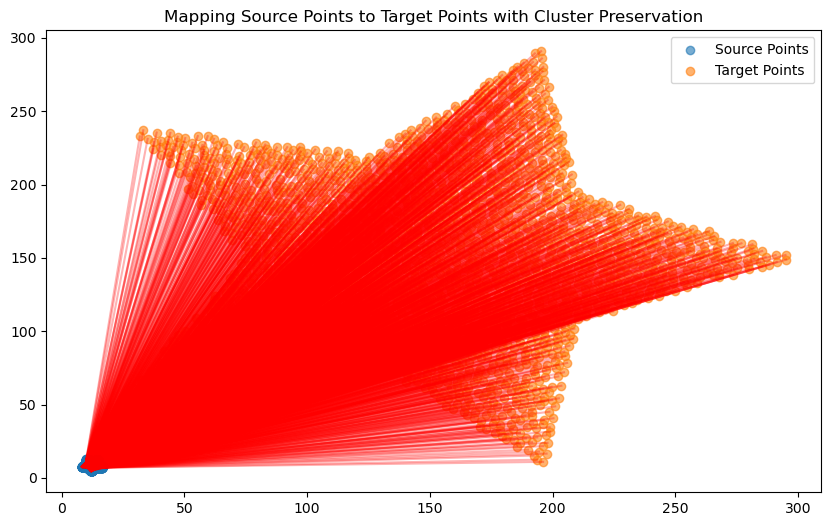

In [33]:
import ot
from scipy.spatial.distance import cdist

# Compute the cost matrix (distance between source and target points)
C = cdist(source, target, 'sqeuclidean')

# Normalize the distributions to ensure they have the same sum
source_weights = np.ones(source.shape[0]) / source.shape[0]
target_weights = np.ones(target.shape[0]) / target.shape[0]

# Ensure star_mask has a 'cluster' column
if 'cluster' not in star_mask.columns:
    kmeans = KMeans(n_clusters=4, random_state=0).fit(star_mask[['x', 'y']].values)
    star_mask['cluster'] = kmeans.labels_

# Adjust the cost matrix to keep clusters close together
for i in range(len(source)):
    for j in range(len(target)):
        if star['cluster'].iloc[i] == star_mask['cluster'].iloc[j]:
            C[i, j] *= 0.5  # Reduce cost for points in the same cluster
        else:
            C[i, j] *= 3.0  # Increase cost for points in different clusters

# Compute the transport plan
transport_plan = ot.emd(source_weights, target_weights, C, numItermax=1000000)

# Map each source point to the target point with the highest transport weight
mapped_indices = np.argmax(transport_plan, axis=1)
mapped_points = target[mapped_indices]

# Add the mapped points to the source dataframe for visualization
star['mapped_x'] = mapped_points[:, 0]
star['mapped_y'] = mapped_points[:, 1]

# Visualize the mapping
plt.figure(figsize=(10, 6))
plt.scatter(star['umap_1'], star['umap_2'], label='Source Points', alpha=0.6)
plt.scatter(target[:, 0], target[:, 1], label='Target Points', alpha=0.6)
for i in range(len(star)):
    plt.plot([star['umap_1'].iloc[i], star['mapped_x'].iloc[i]],
             [star['umap_2'].iloc[i], star['mapped_y'].iloc[i]], 'r-', alpha=0.3)
plt.legend()
plt.title("Mapping Source Points to Target Points with Cluster Preservation")
plt.show()

<Axes: xlabel='mapped_x', ylabel='mapped_y'>

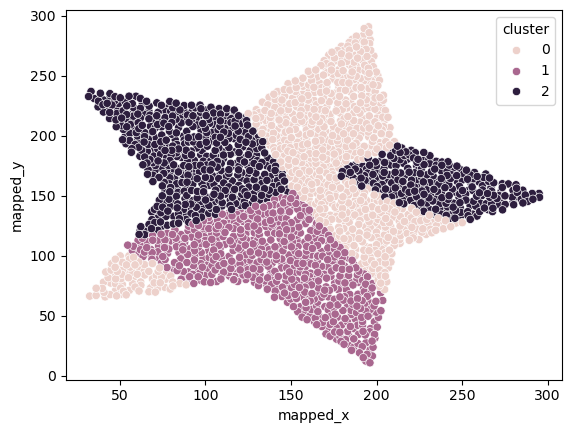

In [34]:
sns.scatterplot(x='mapped_x', y='mapped_y', data=star, hue='cluster')

In [35]:
star['umap_1'] = star['mapped_x']
star['umap_2'] = star['mapped_y']
error, error_list = localreconstruction_KNN(star,15)
star['error'] = error_list
print(error)

/scratch/ipykernel_1708986/2743078178.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = star['mapped_x']
/scratch/ipykernel_1708986/2743078178.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_2'] = star['mapped_y']


0.42574195563886286


/scratch/ipykernel_1708986/2743078178.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['error'] = error_list


<Axes: xlabel='mapped_x', ylabel='mapped_y'>

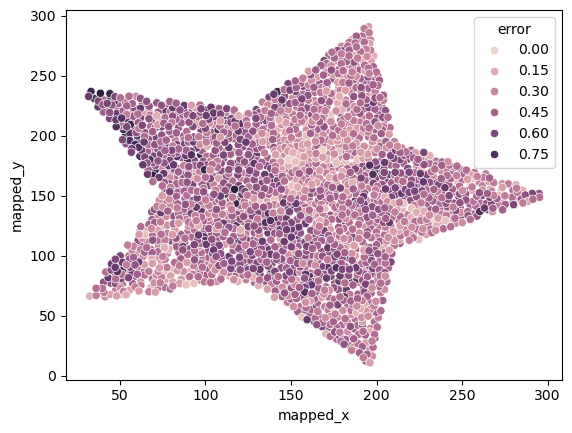

In [36]:
sns.scatterplot(x='mapped_x', y='mapped_y', data=star, hue='error')

In [ ]:
%pip install torch-geometric


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [37]:
import torch
import torch.nn as nn
import torch.optim as optim

class VAE(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, latent_dim * 2)  # Output mean and logvar
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()  
        )

    def encode(self, x):
        h = self.encoder(x)
        mu, logvar = h.chunk(2, dim=-1)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        reconstructed_x = self.decode(z)
        return reconstructed_x, mu, logvar

In [ ]:
class ConvVAE(nn.Module):
    def __init__(self, latent_dim):
        super(ConvVAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, 3, stride=2, padding=1),  # Conv layer 1
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),  # Conv layer 2
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),  # Conv layer 3
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(128*8*8, latent_dim*2)  # Flatten and output mean and logvar
        )

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128*8*8),
            nn.ReLU(),
            nn.Unflatten(1, (128, 8, 8)),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1),  # Deconv layer 1
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1),   # Deconv layer 2
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 3, stride=2, padding=1),    # Deconv layer 3
            nn.Sigmoid()  # Sigmoid for pixel values between 0 and 1
        )

    def encode(self, x):
        h = self.encoder(x)
        mu, logvar = h.chunk(2, dim=-1)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        reconstructed_x = self.decode(z)
        return reconstructed_x, mu, logvar


In [38]:
import torch
import torch.nn.functional as F



# 1) Differentiable pairwise Euclidean distances
def pairwise_distance_torch(X):
    diffs = X.unsqueeze(1) - X.unsqueeze(0)
    return torch.norm(diffs, dim=-1)

# 2) Pairwise distance matching loss
def pairwise_distance_loss(z, D_pseudo):
    D_latent = pairwise_distance_torch(z)
    D_latent = D_latent / (D_latent.max())   
    D_pseudo = D_pseudo / (D_pseudo.max())   
    loss = F.mse_loss(D_latent, D_pseudo)
    return loss

# ========== Training setup ==========

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

pseudo_tensor = torch.tensor(
    pseudo_distance_matrix,
    dtype=torch.float32,
    device=device
)

# Flatten the input tensor to reduce dimensionality
x_data = pseudo_tensor.flatten(start_dim=1)

# Hyperparameters
num_epochs = 500
beta = 1.0         # weight for KL term
learning_rate = 1e-3
vae = VAE(input_dim=x_data.shape[1], hidden_dim=128, latent_dim=30).to(device)
# vae = ConvVAE(latent_dim=10).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=learning_rate)

# ========== Main loop ==========

for epoch in range(1, num_epochs + 1):
    vae.train()
    optimizer.zero_grad()

    # Forward pass through VAE
    x_recon, mu, logvar = vae(x_data)

    # Pairwise distance matching loss
    distance_loss = pairwise_distance_loss(mu, pseudo_tensor)

    # KL divergence
    kl_div = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    # Total loss
    loss = distance_loss + beta * kl_div
    loss.backward()
    optimizer.step()

    if epoch % 5 == 0 or epoch == 1:
        print(f"Epoch {epoch:03d} | Total: {loss.item():.6f} | "
              f"Distance: {distance_loss.item():.6f} | KL: {kl_div.item():.6f}")


Epoch 001 | Total: 0.266121 | Distance: 0.243991 | KL: 0.022131
Epoch 005 | Total: 0.331056 | Distance: 0.279693 | KL: 0.051364
Epoch 010 | Total: 0.281811 | Distance: 0.245320 | KL: 0.036492
Epoch 015 | Total: 0.253330 | Distance: 0.233612 | KL: 0.019719
Epoch 020 | Total: 0.242987 | Distance: 0.224866 | KL: 0.018121
Epoch 025 | Total: 0.222173 | Distance: 0.208530 | KL: 0.013643
Epoch 030 | Total: 0.208206 | Distance: 0.186576 | KL: 0.021630
Epoch 035 | Total: 0.180529 | Distance: 0.169931 | KL: 0.010598
Epoch 040 | Total: 0.182944 | Distance: 0.175896 | KL: 0.007048
Epoch 045 | Total: 0.163127 | Distance: 0.156140 | KL: 0.006987
Epoch 050 | Total: 0.153408 | Distance: 0.146723 | KL: 0.006685
Epoch 055 | Total: 0.143126 | Distance: 0.127224 | KL: 0.015903
Epoch 060 | Total: 0.142922 | Distance: 0.136168 | KL: 0.006754
Epoch 065 | Total: 0.130795 | Distance: 0.123824 | KL: 0.006971
Epoch 070 | Total: 0.129995 | Distance: 0.126963 | KL: 0.003031
Epoch 075 | Total: 0.119713 | Distance: 

In [50]:
import torch
import torch.nn.functional as F

# 1) Differentiable pairwise Euclidean distances
def pairwise_distance_torch(X):
    diffs = X.unsqueeze(1) - X.unsqueeze(0)
    return torch.norm(diffs, dim=-1)

# 2) Stable soft‐neighborhood distribution matching loss
def neighborhood_distribution_loss(
    z,
    D_pseudo,
    temperature: float = 0.1,
    eps: float = 1e-8
):
    """
    Matches neighborhood distributions P (from D_pseudo) 
    and Q (from D_latent) via a smoothed KL.
    """
    N = z.size(0)
    device = z.device

    # 2a) Compute latent distances
    D_latent = pairwise_distance_torch(z)  # [N, N]

    # 2b) Mask out self‐distances (so they don't dominate)
    mask = torch.eye(N, dtype=torch.bool, device=device)
    D_p = D_pseudo.clone().masked_fill(mask, 1e8)
    D_l = D_latent.masked_fill(mask, 1e8)

    # 2c) (Optional but helps) normalize scales to [0,1]
    D_p = D_p / (D_p.max() + eps)
    D_l = D_l / (D_l.max() + eps)

    # 2d) Build soft affinity distributions
    P = F.softmax(-D_p / temperature, dim=1).clamp(min=eps)  # [N, N]
    Q = F.softmax(-D_l / temperature, dim=1).clamp(min=eps)  # [N, N]

    # 2e) Compute KL(P || Q) in a stable way
    #    sum_j P_ij * ( log P_ij - log Q_ij )
    kl_per_row = torch.sum(P * (torch.log(P) - torch.log(Q)), dim=1)
    loss = kl_per_row.mean()
    return loss


# ========== Training setup ==========

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

pseudo_tensor = torch.tensor(
    pseudo_distance_matrix,
    dtype=torch.float32,
    device=device
)

# Flatten the input tensor to reduce dimensionality
x_data = pseudo_tensor.flatten(start_dim=1)

# Hyperparameters
num_epochs    = 500
beta          = 1.0    # KL weight
gamma         = 1.0    # neighborhood loss weight
learning_rate = 1e-3
temperature   = 0.5    # try a slightly higher temp
eps           = 1e-8   # for numerical stability

vae = VAE(
    input_dim = x_data.shape[1],
    hidden_dim=128,
    latent_dim=20
).to(device)

optimizer = torch.optim.Adam(vae.parameters(), lr=learning_rate)

# ========== Main loop ==========

for epoch in range(1, num_epochs + 1):
    vae.train()
    optimizer.zero_grad()

    # Forward pass
    x_recon, mu, logvar = vae(x_data)

    # 1) Reconstruction loss
    recon_loss = F.mse_loss(x_recon, x_data)

    # 2) KL divergence
    kl_div = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    # 3) Neighborhood preservation
    neigh_loss = neighborhood_distribution_loss(
        mu,
        pseudo_tensor,
        temperature=temperature,
        eps=eps
    )

    # Total loss
    loss = recon_loss \
         + beta  * kl_div \
         + gamma * neigh_loss

    loss.backward()
    optimizer.step()

    if epoch % 5 == 0 or epoch == 1:
        print(
            f"Epoch {epoch:03d}"
            f" | Total: {loss.item():.6f}"
            f" | Recon: {recon_loss.item():.6f}"
            f" | KL:    {kl_div.item():.6f}"
            f" | Neigh: {neigh_loss.item():.6f}"
        )


Epoch 001 | Total: 0.216952 | Recon: 0.173448 | KL:    0.043504 | Neigh: 0.000000
Epoch 005 | Total: 0.153847 | Recon: 0.149905 | KL:    0.003943 | Neigh: 0.000000
Epoch 010 | Total: 0.125007 | Recon: 0.123586 | KL:    0.001422 | Neigh: 0.000000
Epoch 015 | Total: 0.099837 | Recon: 0.098462 | KL:    0.001375 | Neigh: 0.000000
Epoch 020 | Total: 0.077161 | Recon: 0.075846 | KL:    0.001315 | Neigh: 0.000000
Epoch 025 | Total: 0.057988 | Recon: 0.056737 | KL:    0.001251 | Neigh: 0.000000
Epoch 030 | Total: 0.042574 | Recon: 0.041384 | KL:    0.001190 | Neigh: 0.000000
Epoch 035 | Total: 0.030493 | Recon: 0.029361 | KL:    0.001132 | Neigh: 0.000000
Epoch 040 | Total: 0.021802 | Recon: 0.020724 | KL:    0.001078 | Neigh: 0.000000
Epoch 045 | Total: 0.015665 | Recon: 0.014640 | KL:    0.001025 | Neigh: 0.000000
Epoch 050 | Total: 0.011440 | Recon: 0.010470 | KL:    0.000970 | Neigh: 0.000000
Epoch 055 | Total: 0.008841 | Recon: 0.007928 | KL:    0.000913 | Neigh: 0.000000
Epoch 060 | Tota

In [51]:
latent_variables = mu.detach().cpu().numpy()
latent_variables = pd.DataFrame(latent_variables, columns=['latent_1', 'latent_2'])
star['umap_1'] = latent_variables['latent_1']
star['umap_2'] = latent_variables['latent_2']
sns.scatterplot(x='latent_1', y='latent_2', data=star, hue='error')
error , error_list = localreconstruction_KNN(star,15)
print(error)

ValueError: Shape of passed values is (2134, 20), indices imply (2134, 2)

/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ipykernel_1708986/1843345519.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = embedding[:, 0]
/scratch/ipykernel_1708986/1843345519.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-co

Text(0.5, 1.0, 'UMAP of Latent Variables')

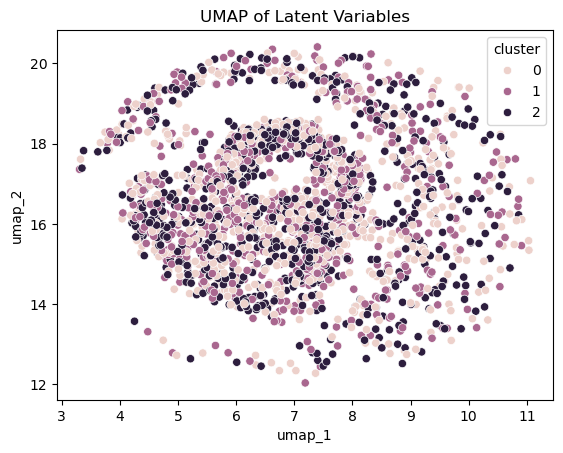

In [52]:
# Extract latent variables (mu) from the VAE
latent_variables = mu.detach().cpu().numpy()

#run UMAP on the latent variables
umap_model = umap.UMAP(n_neighbors=75, min_dist=0.99, metric='euclidean', random_state=42)
embedding = umap_model.fit_transform(latent_variables)
star['umap_1'] = embedding[:, 0]
star['umap_2'] = embedding[:, 1]
# Visualize the UMAP embedding
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='cluster')
plt.title("UMAP of Latent Variables")


In [53]:
error, error_list = localreconstruction_KNN(star,15)
print(error)

0.0073726960324898465


Text(0.5, 1.0, 't-SNE with KNN Similarity 0.62')

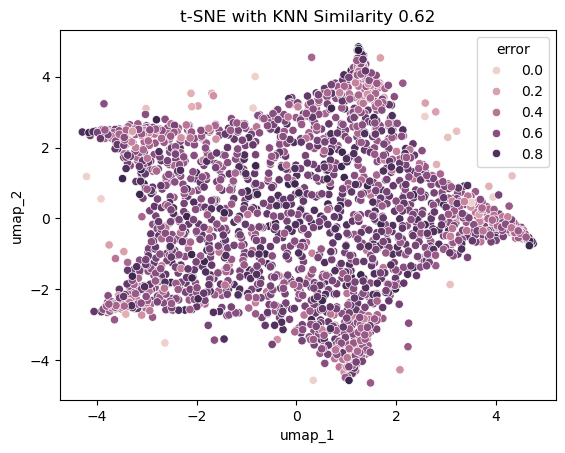

In [43]:
tsne_embedding = tsne_driver(pseudo_distance_matrix)
star_eval = star.copy()
star_eval['umap_1'] = tsne_embedding[:, 0]
star_eval['umap_2'] = tsne_embedding[:, 1]
error, error_list = localreconstruction_KNN(star_eval,15)
star_eval['error'] = error_list
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error')
plt.title(f"t-SNE with KNN Similarity {error:.2f}")


/scratch/ipykernel_1708986/2304636524.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['VAE', 'UMAP', 't-SNE', 'Spectral Map'],


Text(0.5, 0, 'Methods')

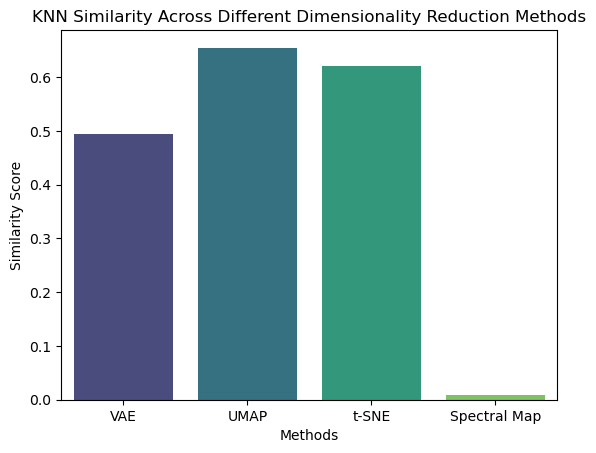

In [49]:
knn_vae = 0.4938
knn_umap = 0.6545142143080287
knn_tsne = 0.62
knn_spectral_map = 0.008122461730709154

#Create a Bar plot using seaborn
sns.barplot(x=['VAE', 'UMAP', 't-SNE', 'Spectral Map'], 
            y=[knn_vae, knn_umap, knn_tsne, knn_spectral_map], 
            palette='viridis')
plt.title("KNN Similarity Across Different Dimensionality Reduction Methods")
plt.ylabel("Similarity Score")
plt.xlabel("Methods")




# Testing Graph Neural Network for Pruning

In [ ]:
import torch
import numpy as np
from torch_geometric.data import Data
import torch_geometric.utils

M = interaction_matrix
n = M.shape[0]

# Create a graph from the interaction matrix
source_nodes, target_nodes = np.nonzero(M)
edge_index = torch.tensor(np.array([source_nodes, target_nodes]), dtype=torch.long)
edge_attr = M[source_nodes, target_nodes]
edge_attr = edge_attr / edge_attr.max()

# Use edge_index directly
degrees = torch_geometric.utils.degree(edge_index[0], n).unsqueeze(1)

# Now construct the data
data = Data(x=degrees, edge_index=edge_index, edge_attr=torch.tensor(edge_attr, dtype=torch.float))

print(data)


Data(x=[2134, 1], edge_index=[2, 4551524], edge_attr=[4551524])


In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

class GCN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

input_dim = 1
hidden_dim = 256
output_dim = 128


Epoch 050 | Loss: nan
Epoch 100 | Loss: nan
Epoch 150 | Loss: nan
Epoch 200 | Loss: nan
Epoch 250 | Loss: nan
Epoch 300 | Loss: nan
Epoch 350 | Loss: nan
Epoch 400 | Loss: nan
Epoch 450 | Loss: nan
Epoch 500 | Loss: nan


torch.Size([2134, 128])


/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ipykernel_2066714/3392495515.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = embedding[:, 0]
/scratch/ipykernel_2066714/3392495515.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-co

0.006747891283973758


<Axes: xlabel='umap_1', ylabel='umap_2'>

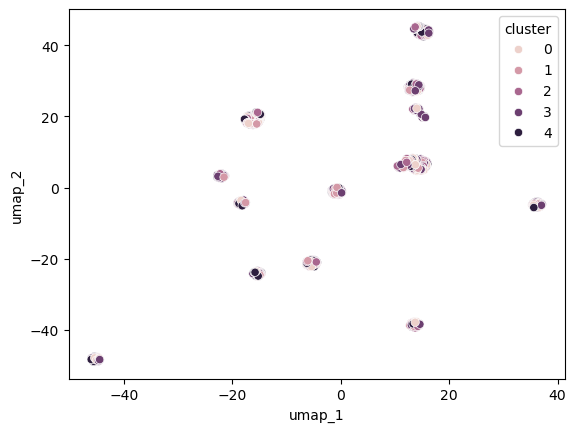

In [ ]:
print(out.shape)  

# run UMAP on the output of the GCN
umap_model = umap.UMAP(n_neighbors=75, min_dist=0.99, metric='euclidean', random_state=42)
embedding = umap_model.fit_transform(out.detach().numpy())
star['umap_1'] = embedding[:, 0]
star['umap_2'] = embedding[:, 1]
localreconstruction_KNN(star,15)
print(error)
# Visualize the UMAP embedding
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='cluster')



In [ ]:
import copy
import torch
import torch.nn.functional as F

def augment_graph(data, drop_edge_prob=0.2):
    """
    Randomly drop edges without changing nodes.
    """
    data_aug = copy.deepcopy(data)

    num_edges = data_aug.edge_index.size(1)
    mask = torch.rand(num_edges, device=data.edge_index.device) > drop_edge_prob

    data_aug.edge_index = data_aug.edge_index[:, mask]
    if data_aug.edge_attr is not None:
        data_aug.edge_attr = data_aug.edge_attr[mask]

    # Node features stay the same
    data_aug.x = data.x

    return data_aug

def nt_xent_loss(z1, z2, temperature=0.5):
    """Normalized Temperature-Scaled Cross Entropy Loss."""
    batch_size = z1.size(0)
    z = torch.cat([z1, z2], dim=0)  # [2N, d]
    z = F.normalize(z, dim=1)

    sim = torch.matmul(z, z.T) / temperature

    mask = torch.eye(2 * batch_size, device=z.device).bool()
    sim.masked_fill_(mask, -9e15)

    positives = torch.cat([torch.diag(sim, batch_size), torch.diag(sim, -batch_size)], dim=0)
    denominator = torch.sum(torch.exp(sim), dim=1)

    loss = -torch.log(torch.exp(positives) / denominator)
    return loss.mean()

model = GCN(input_dim=1, hidden_dim=256, output_dim=128).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# === Only once: make sure data.x is float ===
data.x = data.x.float()

# Training loop
for epoch in range(1, 20):
    model.train()
    optimizer.zero_grad()

    data1 = augment_graph(data)
    data2 = augment_graph(data)

    # Forward
    z1 = model(data1)
    z2 = model(data2)

    # Loss
    loss = nt_xent_loss(z1, z2)

    # Backprop
    loss.backward()
    optimizer.step()

    if epoch % 50 == 0:
        print(f"Epoch {epoch:03d} | Loss: {loss.item():.6f}")


Epoch 050 | Loss: 8.358665


KeyboardInterrupt: 

# Unbalanced Optimal Transport with Laplacian Regularization

In [ ]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import laplacian
import ot

# Parameters
k = 15
reg = 1.0        # Entropic regularization for Sinkhorn
reg_m = 1.0      # Marginal relaxation for unbalanced OT

# Example data (replace with your actual data)
umap_coords = star[['umap_1', 'umap_2']].values
ground_truth = star_mask[['x', 'y']].values
n_src = umap_coords.shape[0]
n_tgt = ground_truth.shape[0]

# 1. Build KNN graph from UMAP embeddings
nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(umap_coords)
distances, indices = nbrs.kneighbors(umap_coords)

# 2. Create sparse adjacency matrix
row_indices = np.repeat(np.arange(n_src), k)
col_indices = indices.flatten()
data = distances.flatten()
adjacency_matrix = csr_matrix((data, (row_indices, col_indices)), shape=(n_src, n_src))

# 3. Compute normalized graph Laplacian
laplacian_matrix = laplacian(adjacency_matrix, normed=True)

# 4. Compute cost matrix
cost_matrix = pairwise_distances(umap_coords, ground_truth, metric='sqeuclidean')

# 5. Define marginals
a = np.ones(n_src) / n_src
b = np.ones(n_tgt) / n_tgt

# 6. Step 1: Compute unbalanced OT transport plan
G = ot.unbalanced.sinkhorn_unbalanced(a, b, cost_matrix, reg=reg, reg_m=reg_m, numItermax=1000)

# 7. Step 2: Apply Laplacian regularization on transported source embeddings
# (This is a post-processing step, not a joint optimization)
transported_source = G @ ground_truth
regularized_source = laplacian_matrix @ transported_source

# Now you can use `regularized_source` for further analysis or visualization


/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/ot/unbalanced/_sinkhorn.py:738: RuntimeWarning: divide by zero encountered in divide
  u = (a / Kv) ** fi_1
/gpfs/commons/home/ikothari/mambaforge/envs/STmic/lib/python3.9/site-packages/ot/unbalanced/_sinkhorn.py:751: UserWarning: Numerical errors at iteration 0
  warnings.warn("Numerical errors at iteration %s" % i)


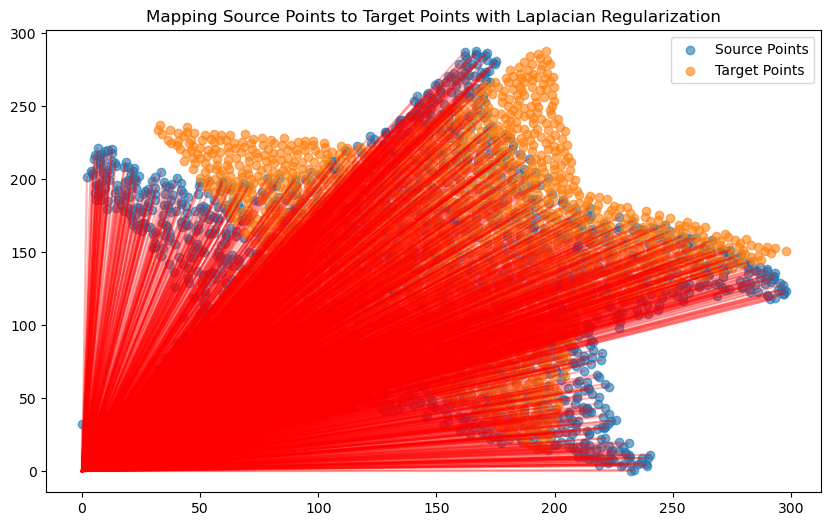

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import laplacian
import ot

# Parameters
k = 15

# Example data (replace with your actual data)
umap_coords = star[['umap_1', 'umap_2']].values
ground_truth = star_mask[['x', 'y']].values
n_src = umap_coords.shape[0]
n_tgt = ground_truth.shape[0]

# 1. Build KNN graph from UMAP embeddings
nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(umap_coords)
distances, indices = nbrs.kneighbors(umap_coords)

# 2. Create sparse adjacency matrix
row_indices = np.repeat(np.arange(n_src), k)
col_indices = indices.flatten()
data = distances.flatten()
adjacency_matrix = csr_matrix((data, (row_indices, col_indices)), shape=(n_src, n_src))

# 3. Compute normalized graph Laplacian
laplacian_matrix = laplacian(adjacency_matrix, normed=True)

# 4. Compute cost matrix
cost_matrix = pairwise_distances(umap_coords, ground_truth, metric='sqeuclidean')

# 5. Define marginals
a = np.ones(n_src) / n_src
b = np.ones(n_tgt) / n_tgt

# 6. Step 1: Compute normal OT transport plan (no regularization)
G = ot.emd(a, b, cost_matrix)

# 7. Step 2: Compute the weighted average of target points based on transport plan
# This maps source points to the target points according to the transport plan
mapped_source = G.T @ ground_truth  # G.T is the transpose, as we're transporting mass from source to target

# 8. Step 3: Apply Laplacian smoothing on the mapped source embeddings
regularized_source = laplacian_matrix @ mapped_source

# visualize the mapping
plt.figure(figsize=(10, 6))
plt.scatter(star['umap_1'], star['umap_2'], label='Source Points', alpha=0.6)
plt.scatter(ground_truth[:, 0], ground_truth[:, 1], label='Target Points', alpha=0.6)
for i in range(len(star)):
    plt.plot([star['umap_1'].iloc[i], regularized_source[i, 0]],
             [star['umap_2'].iloc[i], regularized_source[i, 1]], 'r-', alpha=0.3)
plt.legend()
plt.title("Mapping Source Points to Target Points with Laplacian Regularization")
plt.show()


/scratch/ipykernel_2451258/2824789101.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = mapped_points[:, 0]
/scratch/ipykernel_2451258/2824789101.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_2'] = mapped_points[:, 1]


0.0063417681974383


/scratch/ipykernel_2451258/2824789101.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['error'] = error_list


<Axes: xlabel='umap_1', ylabel='umap_2'>

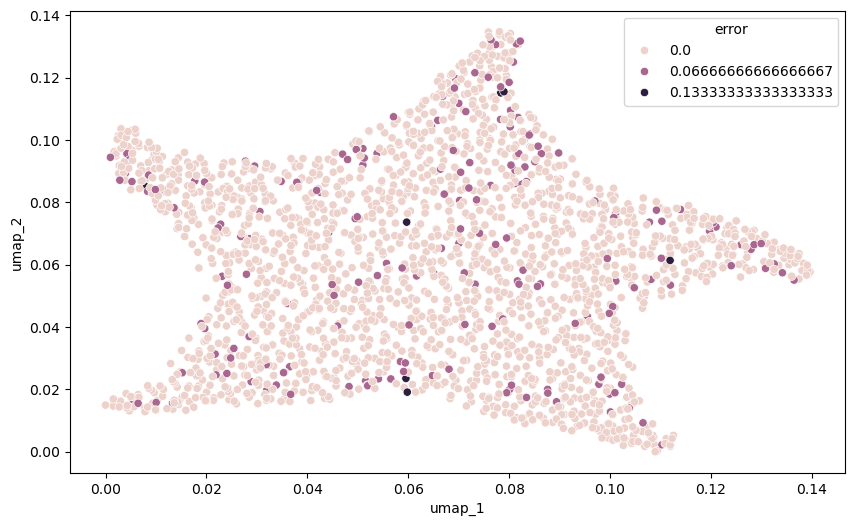

In [ ]:
# map my target to the source 
mapped_points = G @ umap_coords
mapped_points = np.array(mapped_points)
# Add the mapped points to the source dataframe for visualization
star['umap_1'] = mapped_points[:, 0]
star['umap_2'] = mapped_points[:, 1]
# Visualize the mapping
plt.figure(figsize=(10, 6))
error, error_list = localreconstruction_KNN(star,15)
star['error'] = error_list
print(error)
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='error')


Iter    0, Cost 0.000003
Iter  100, Cost 0.000003
Iter  200, Cost 0.000003
Iter  300, Cost 0.000003
Iter  400, Cost 0.000003
Iter  500, Cost 0.000003
Iter  600, Cost 0.000003
Iter  700, Cost 0.000003
Iter  800, Cost 0.000003
Iter  900, Cost 0.000003


/scratch/ipykernel_2451258/3210626127.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = tally_umap[:, 0]
/scratch/ipykernel_2451258/3210626127.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_2'] = tally_umap[:, 1]
/scratch/ipykernel_2451258/3210626127.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

0.6470165573258356


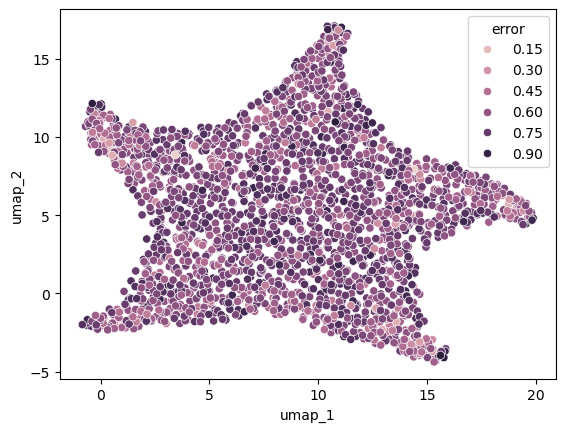

In [ ]:
star['umap_1'] = tally_umap[:, 0]
star['umap_2'] = tally_umap[:, 1]
error, error_list = localreconstruction_KNN(star,15)
star['error'] = error_list
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='error')
print(error)


In [ ]:
import numpy as np
import torch
from sklearn.neighbors import NearestNeighbors
import torch.nn.functional as F
from scipy.spatial.distance import cdist
import ot  # Assuming you're using the 'pyot' library for optimal transport

# 1. Build the target KNN graph from UMAP coordinates
umap_coords = star[['umap_1', 'umap_2']].values
ground_truth = star_mask[['x', 'y']].values
k = 15
nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(umap_coords)
distances, indices = nbrs.kneighbors(umap_coords)

# 2. Compare KNN structures between EMD and UMAP using a similarity measure
def compare_knn_graphs(emd_coords, umap_coords, k=15):
    # Compute KNN for EMD
    nbrs_emd = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(emd_coords)
    _, knn_emd = nbrs_emd.kneighbors(emd_coords)
    
    # Compute KNN for UMAP
    nbrs_umap = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(umap_coords)
    _, knn_umap = nbrs_umap.kneighbors(umap_coords)
    
    return knn_emd, knn_umap

# 3. Compute Jaccard similarity to compare KNN graphs
def jaccard_similarity(knn_emd, knn_umap):
    intersection = np.array([len(set(knn_emd[i]).intersection(set(knn_umap[i]))) for i in range(len(knn_emd))])
    union = np.array([len(set(knn_emd[i]).union(set(knn_umap[i]))) for i in range(len(knn_emd))])
    return intersection / union

# 4. Optimal Transport step: mapping UMAP to ground truth once
def optimal_transport_once(umap_coords, ground_truth):
    # Compute the cost matrix (pairwise squared Euclidean distances between UMAP and ground truth points)
    C = cdist(umap_coords, ground_truth, 'sqeuclidean')
    
    # Normalize the distributions to ensure they have the same sum (uniform distribution for now)
    source_weights = np.ones(umap_coords.shape[0]) / umap_coords.shape[0]
    target_weights = np.ones(ground_truth.shape[0]) / ground_truth.shape[0]
    
    # Solve the OT problem to get the transport plan
    transport_plan = ot.emd(source_weights, target_weights, C, numItermax=1000000)
    
    # Map each source point to the target point with the highest transport weight
    mapped_indices = np.argmax(transport_plan, axis=1)
    mapped_points = ground_truth[mapped_indices]
    
    return mapped_points

star_eval = star.copy()
star_eval['umap_1'] = umap_coords[:, 0]
star_eval['umap_2'] = umap_coords[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
print("Initial Accuracy:", error)

# 5. Flipping points based on KNN similarity after OT
def flip_points(emd_coords, knn_emd, knn_umap, threshold=0.5):
    similarities = jaccard_similarity(knn_emd, knn_umap)
    
    for i in range(emd_coords.shape[0]):
        if similarities[i] < threshold:  # If the similarity is below threshold, flip points
            # Find the point with the most mismatch
            flip_with = np.random.choice(np.where(similarities < threshold)[0])
            emd_coords[i], emd_coords[flip_with] = emd_coords[flip_with], emd_coords[i]
            
    return emd_coords

# 6. Set up optimization process with OT and flipping
threshold = 0.5  # Adjust threshold based on desired similarity level
num_iterations = 4000

# Step 1: Perform Optimal Transport once to align UMAP with ground truth
mapped_points = optimal_transport_once(umap_coords, ground_truth)

# Step 2: Perform the optimization loop without running OT again
for iter in range(num_iterations):
    # Compare the KNN of the EMD embedding and UMAP embedding
    knn_emd, knn_umap = compare_knn_graphs(mapped_points, umap_coords, k)
    
    # Flip points to improve KNN alignment after OT
    mapped_points = flip_points(mapped_points, knn_emd, knn_umap, threshold)
    
    # Update the star dictionary with the new mapped points
    star_eval['umap_1'] = mapped_points[:, 0]
    star_eval['umap_2'] = mapped_points[:, 1]
    
    # Optionally track the error or loss during the optimization
    error, error_list = localreconstruction_KNN(star_eval, 15)
    
    
    # (Optional) Visualize or track loss or differences
    if iter % 200 == 0:
        print(f"Iteration {iter} completed.")
        print(error)


Initial Accuracy: 0.6470165573258356
Iteration 0 completed.
0.4381130896594814


Final mapped points shape: (2134, 2)


/scratch/ipykernel_2451258/3804446015.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_1'] = mapped_points[:, 0]
/scratch/ipykernel_2451258/3804446015.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['umap_2'] = mapped_points[:, 1]


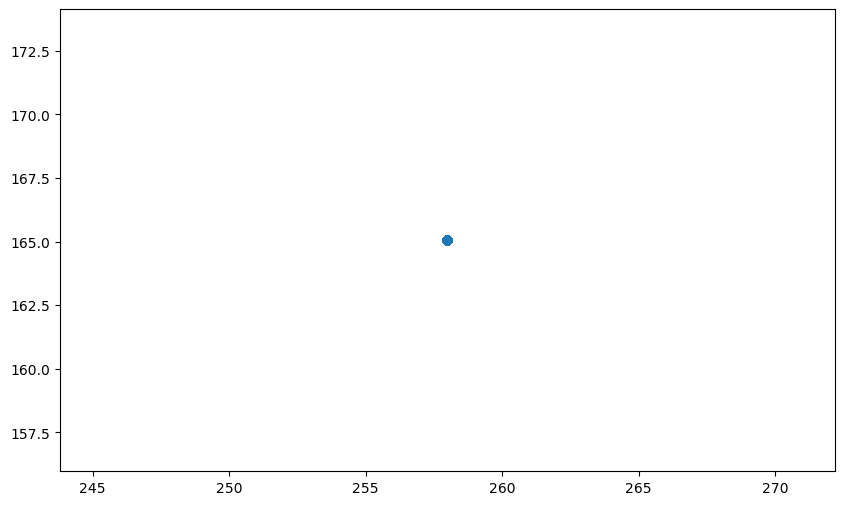

In [ ]:
#visualize the final mapped points
plt.figure(figsize=(10, 6))
plt.scatter(mapped_points[:, 0], mapped_points[:, 1], label='Mapped Points', alpha=0.6)
print("Final mapped points shape:", mapped_points.shape)
#fix the scale
star['umap_1'] = mapped_points[:, 0]
star['umap_2'] = mapped_points[:, 1]
error, error_list = localreconstruction_KNN(star,15)


- To Do
- First we map using Earth Movers Distance
- Then we jitter points so that we converge to original KNN graph
- we can calculate the difference between the EMD embedding and UMAP embedding by taking the knn 15 nearest neighbours of each point and comparing to the UMAP embedding
- We then can compare the EMD embedding to the UMAP KNN embedding
- flip points until we reach the goal embedding - thus maintaining global structure while improving KNN similiarity

# Using Graph Matching

/scratch/ipykernel_1708986/2964889608.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['error'] = error_list


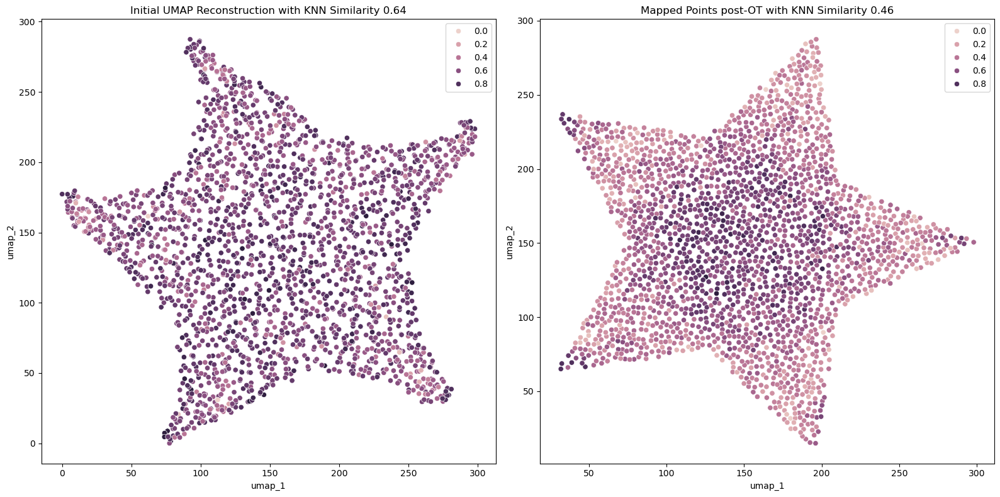

In [157]:
from scipy.spatial.distance import cdist
import ot
umap_points   = star[['umap_1', 'umap_2']].values
ground_truth  = star_mask[['x', 'y']].values


C = cdist(umap_points, ground_truth, metric='sqeuclidean')
n_src, n_tgt = umap_points.shape[0], ground_truth.shape[0]
a = np.ones(n_src) / n_src
b = np.ones(n_tgt) / n_tgt

P = ot.emd(a, b, C, numItermax=1_000_000)
mapped_indices = np.argmax(P, axis=1)
mapped_points  = ground_truth[mapped_indices]

star_eval = star.copy()
star_eval['umap_1'] = mapped_points[:, 0]
star_eval['umap_2'] = mapped_points[:, 1]
error_eval , error_list_eval = localreconstruction_KNN(star_eval, 15)
star_eval['error_eval'] = error_list_eval

error, error_list = localreconstruction_KNN(star, 15)
star['error'] = error_list
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for the initial UMAP reconstruction
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='error', ax=axes[0])
axes[0].set_title("Initial UMAP Reconstruction with KNN Similarity {:.2f}".format(error))
axes[0].legend(loc='upper right')

# Plot for the mapped points post-OT
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error_eval', ax=axes[1])
axes[1].set_title("Mapped Points post-OT with KNN Similarity {:.2f}".format(error_eval))
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()


In [158]:
import numpy as np
from scipy.spatial.distance import cdist
import ot
from scipy.optimize import linear_sum_assignment

# Extract coordinates
umap_points = star[['umap_1', 'umap_2']].values
ground_truth = star_mask[['x', 'y']].values

# Compute intra-domain distance matrices
C1 = cdist(umap_points, umap_points, metric='sqeuclidean')
C2 = cdist(ground_truth, ground_truth, metric='sqeuclidean')

# Uniform distributions
n = umap_points.shape[0]
a = np.ones(n) / n
b = np.ones(n) / n

# Compute GW coupling
gw_coupling = ot.gromov.gromov_wasserstein(C1, C2, a, b, 'square_loss')

# Hungarian algorithm for one-to-one matching
row_ind, col_ind = linear_sum_assignment(-gw_coupling)
mapped_indices = np.zeros(n, dtype=int)
mapped_indices[row_ind] = col_ind

# Map points
mapped_points = ground_truth[mapped_indices]

# (Continue with your evaluation and plotting as before)
star_eval = star.copy()
star_eval['umap_1'] = mapped_points[:, 0]
star_eval['umap_2'] = mapped_points[:, 1]
error_eval, error_list_eval = localreconstruction_KNN(star_eval, 15)


Text(0.5, 1.0, 'Mapped Points post-GW with KNN Similarity 0.59')

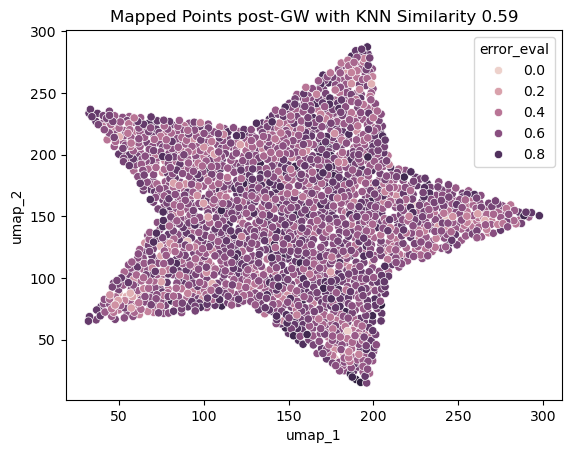

In [159]:
star_eval['error_eval'] = error_list_eval
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error_eval')
plt.title(f"Mapped Points post-GW with KNN Similarity {error_eval:.2f}")

In [133]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import ConvexHull

# --- Step 1: Nearest neighbors ---
def find_nearest_neighbors(points, k=15):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(points)
    distances, indices = nbrs.kneighbors(points)
    return distances, indices

# --- Step 2: KNN comparison ---
def compare_knn(knn1, knn2):
    indices1 = knn1[1]
    indices2 = knn2[1]
    return np.mean([
        len(set(indices1[i]) & set(indices2[i])) / len(set(indices1[i]) | set(indices2[i]))
        for i in range(len(indices1))
    ])

def per_point_knn_similarity(knn1, knn2):
    idx1 = knn1[1]
    idx2 = knn2[1]
    return np.array([
        len(set(idx1[i]) & set(idx2[i])) / len(set(idx1[i]) | set(idx2[i]))
        for i in range(len(idx1))
    ])

# --- Step 3: Convex hull check ---
def is_inside_hull(points, hull_points):
    hull = ConvexHull(hull_points)
    # Check if each point satisfies the convex hull equations
    return np.all(np.dot(points, hull.equations[:, :-1].T) + hull.equations[:, -1] <= 1e-12, axis=1)

# --- Step 4: Apply smoothing with density and perimeter preservation ---
def apply_density_perimeter_preservation(mapped, umap, umap_knn_indices, bad_points, alpha=0.2, max_shift=0.01, max_total_shift_fraction=0.1, noise_scale=0.005):
    corrected = mapped.copy()
    corrected_prev = mapped.copy()
    
    # Apply local smoothing
    for i in bad_points:
        neighbors = umap_knn_indices[i]
        target = mapped[neighbors].mean(axis=0)
        delta = target - mapped[i]
        norm = np.linalg.norm(delta)
        
        # Limit shift to max_shift
        if norm > max_shift:
            delta = delta / norm * max_shift
        corrected[i] += alpha * delta

    # Add noise to introduce small changes
    noise = np.random.normal(scale=noise_scale, size=corrected.shape)
    corrected += noise

    # Check if the perimeter constraint is satisfied
    hull = ConvexHull(mapped)
    if not np.all(is_inside_hull(corrected, mapped[hull.vertices])):
        print("Perimeter constraint violated: points moved outside of convex hull")
        corrected = mapped.copy()  # Revert to original if constraint is violated

    # Compute total change
    delta = np.linalg.norm(corrected - corrected_prev, axis=1)
    num_moved = np.sum(delta > max_shift)
    fraction_moved = num_moved / len(mapped)
    
    if fraction_moved > max_total_shift_fraction:
        print(f"Too many points moved: {fraction_moved:.4f} (aborting correction)")
        corrected = mapped.copy()  # Abort smoothing if too many points moved

    return corrected

# ------------------ Main Pipeline ------------------
# Assume: mapped_points and umap_points are already defined

k = 15
similarity_threshold = 1
alpha = 1
max_shift = 1
max_total_shift_fraction = 1

# Compute KNN for both mapped and UMAP points
knn_mapped = find_nearest_neighbors(mapped_points, k=k)
knn_umap   = find_nearest_neighbors(umap_points, k=k)

# Check initial similarity
initial_similarity = compare_knn(knn_mapped, knn_umap)
print(f"Initial similarity: {initial_similarity:.4f}")

# Compute per-point KNN similarity and identify bad points
sims = per_point_knn_similarity(knn_mapped, knn_umap)
bad_points = np.where(sims < similarity_threshold)[0]
print(f"{len(bad_points)} points have changed neighborhoods.")

# Apply density and perimeter-preserving smoothing
corrected = apply_density_perimeter_preservation(mapped_points, umap_points, knn_umap[1], bad_points, alpha=alpha, max_shift=max_shift, max_total_shift_fraction=max_total_shift_fraction)

# Final similarity check after smoothing
knn_corrected = find_nearest_neighbors(corrected, k=k)
final_similarity = compare_knn(knn_corrected, knn_umap)
print(f"Final similarity after correction: {final_similarity:.4f}")


Initial similarity: 0.4286
2133 points have changed neighborhoods.
Final similarity after correction: 0.4738


Text(0.5, 1.0, 'Mapped Points post-OT with KNN Similarity 0.48')

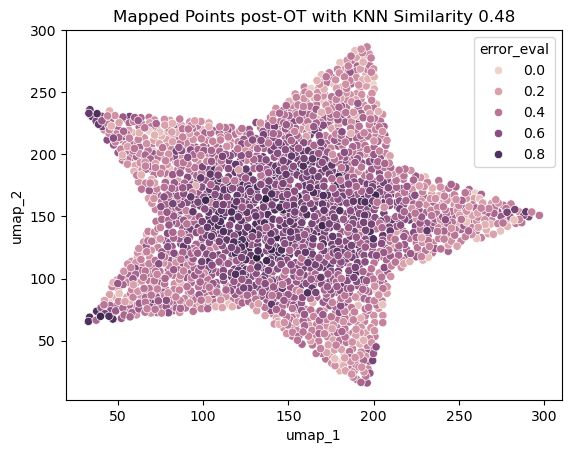

In [134]:
star_eval = star.copy()
star_eval['umap_1'] = corrected[:, 0]
star_eval['umap_2'] = corrected[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error_eval'] = error_list
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error_eval')
plt.title(f"Mapped Points post-OT with KNN Similarity {error:.2f}")

Initial KNN similarity: 0.6155
2127 points have changed neighborhoods.


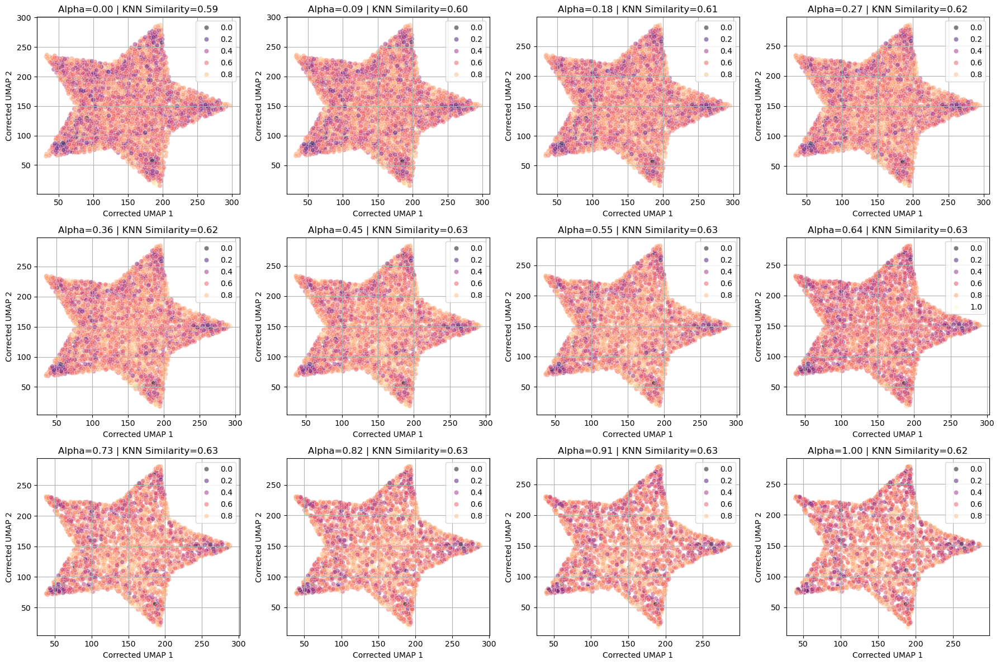

In [160]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors

# --- Helper Functions ---
def find_nearest_neighbors(points, k=15):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(points)
    distances, indices = nbrs.kneighbors(points)
    return distances, indices

def compare_knn(knn1, knn2):
    similarities = []
    indices1 = knn1[1]
    indices2 = knn2[1]
    for i in range(len(indices1)):
        intersection = len(set(indices1[i]).intersection(set(indices2[i])))
        union = len(set(indices1[i]).union(set(indices2[i])))
        similarities.append(intersection / union)
    return np.mean(similarities)

def per_point_knn_similarity(knn1, knn2):
    idx1 = knn1[1]
    idx2 = knn2[1]
    n, k = idx1.shape
    sims = np.zeros(n, dtype=float)
    for i in range(n):
        set1 = set(idx1[i])
        set2 = set(idx2[i])
        sims[i] = len(set1 & set2) / len(set1 | set2)
    return sims

# --- Main Experiment ---

# Precompute initial neighbors
knn_mapped = find_nearest_neighbors(mapped_points, k=15)
knn_umap = find_nearest_neighbors(umap_points, k=15)

# Initial similarity
initial_similarity = compare_knn(knn_mapped, knn_umap)
print(f"Initial KNN similarity: {initial_similarity:.4f}")

# Bad points
sims = per_point_knn_similarity(knn_mapped, knn_umap)
bad_points = np.where(sims < 1.0)[0]
print(f"{len(bad_points)} points have changed neighborhoods.")

# Values to scan
alphas = np.linspace(0, 1.0, 12)  # 0.0, 0.1, ..., 1.0

# Create the grid of subplots
fig, axes = plt.subplots(3, 4, figsize=(18, 12))  # 3 rows and 4 columns of subplots
axes = axes.flatten()  # Flatten to make indexing easier

for idx, alpha in enumerate(alphas):
    corrected = mapped_points.copy()

    # Move bad points toward their neighbors' centroid
    for i in bad_points:
        neigh_idxs = knn_umap[1][i]
        neighbor_positions = mapped_points[neigh_idxs]
        centroid = neighbor_positions.mean(axis=0)
        corrected[i] = (1 - alpha) * mapped_points[i] + alpha * centroid

    # Recompute neighbors
    knn_corrected = find_nearest_neighbors(corrected, k=15)
    new_similarity = compare_knn(knn_corrected, knn_umap)

    # Local reconstruction error
    star_eval = star.copy()
    star_eval['umap_1'] = corrected[:, 0]
    star_eval['umap_2'] = corrected[:, 1]
    error, error_list = localreconstruction_KNN(star_eval, 15)
    star_eval['error'] = error_list

    # --- Scatterplot ---
    ax = axes[idx]
    sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error', alpha=0.5, palette='magma', ax=ax)
    # sns.scatterplot(x='x', y='y', data=star, color='black', marker='x', s=10, label='Ground truth', ax=ax)
    

    ax.set_title(f"Alpha={alpha:.2f} | KNN Similarity={error:.2f}")
    ax.set_xlabel('Corrected UMAP 1')
    ax.set_ylabel('Corrected UMAP 2')
    ax.legend()
    ax.grid()

# Adjust layout and display
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import networkx as nx
from sklearn.neighbors import NearestNeighbors
from networkx.algorithms.similarity import optimize_graph_edit_distance
from tqdm import tqdm

def find_nearest_neighbors(points: np.ndarray, k: int = 15):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(points)
    distances, indices = nbrs.kneighbors(points)
    return distances, indices

def knn_to_graph(knn_indices: np.ndarray) -> nx.Graph:
    n_samples = knn_indices.shape[0]
    G = nx.Graph()
    G.add_nodes_from(range(n_samples))
    for i, neighbors in enumerate(knn_indices):
        for j in neighbors:
            if i != j:
                G.add_edge(i, j)
    return G


def compute_mapping_by_graph_edit_distance(G1: nx.Graph, G2: nx.Graph):
    ged_iter = optimize_graph_edit_distance(G1, G2)
    
    for best_ged, best_mapping in tqdm(ged_iter, desc="Computing GED", unit="iteration"):
        pass  # Progress is tracked here
    
    return {g2: g1 for g1, g2 in best_mapping.items()} if best_mapping else None


def compare_knn(knn1, knn2) -> float:
    idx1 = knn1[1]; idx2 = knn2[1]
    sims = []
    for a, b in zip(idx1, idx2):
        s1, s2 = set(a), set(b)
        sims.append(len(s1 & s2) / len(s1 | s2) if s1 or s2 else 1.0)
    return float(np.mean(sims))


In [ ]:
from tqdm import tqdm
import numpy as np

# Step 1: Find k-NN for both sets
with tqdm(total=2, desc="Finding k-NN") as pbar:
    _, knn_mapped = find_nearest_neighbors(mapped_points, k=15)
    pbar.update(1)
    _, knn_umap = find_nearest_neighbors(umap_points, k=15)
    pbar.update(1)

# Step 2: Convert k-NNs to graphs
with tqdm(total=2, desc="Converting to graphs") as pbar:
    G_map = knn_to_graph(knn_mapped)
    pbar.update(1)
    G_um = knn_to_graph(knn_umap)
    pbar.update(1)

# Step 3: Compute mapping using Graph Edit Distance
tqdm.write("Computing graph edit distance mapping...")
mapping = compute_mapping_by_graph_edit_distance(G_map, G_um)

# Step 4: Permute mapped_points according to the mapping
tqdm.write("Permuting mapped points according to mapping...")
permuted = np.zeros_like(mapped_points)
for umap_idx, map_idx in tqdm(mapping.items(), desc="Permuting points"):
    permuted[umap_idx] = mapped_points[map_idx]

# Step 5: Recompute k-NN on permuted points
tqdm.write("Recomputing k-NN on permuted points...")
_, knn_perm = find_nearest_neighbors(permuted, k=15)

# Step 6: Compare neighborhood similarity
tqdm.write("Comparing neighborhood similarity...")
sim = compare_knn(knn_perm, knn_umap)

# Step 7: Print result
print(f"Mean Jaccard similarity after mapping: {sim:.4f}")


Converting to graphs: 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]


Computing graph edit distance mapping...


Computing GED: 0iteration [10:17, ?iteration/s]


KeyboardInterrupt: 

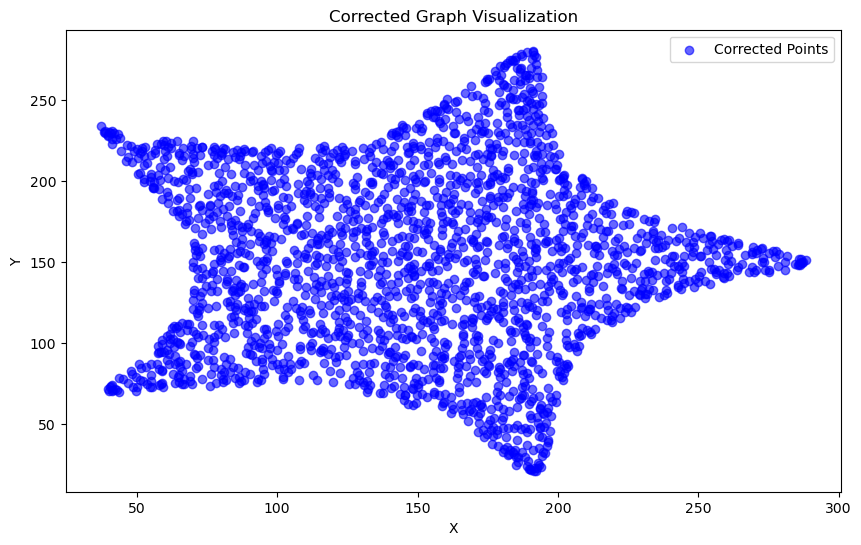

In [ ]:
import matplotlib.pyplot as plt

# Visualize the corrected graph
plt.figure(figsize=(10, 6))
plt.scatter(corrected[:, 0], corrected[:, 1], label='Corrected Points', alpha=0.6, c='blue')



plt.title("Corrected Graph Visualization")
plt.xlabel("X")
plt.ylabel("Y")
plt.legend()
plt.show()

Frobenius norm error: 5113.1724
0.5994064354889097


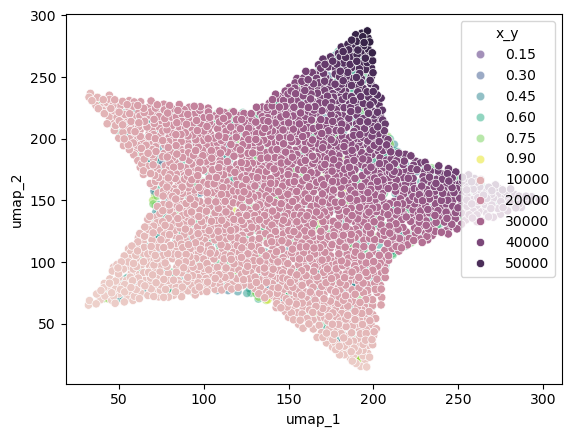

In [ ]:
star_eval = star.copy()
star_eval['umap_1'] = corrected[:, 0]
star_eval['umap_2'] = corrected[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error'] = error_list
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error',alpha = 0.5,palette='viridis')
sns.scatterplot(x='x', y='y', data=star, hue='x_y')
# calculate the frobenius norm
frob_error = np.linalg.norm(star_eval[['umap_1', 'umap_2']].values - star[['x', 'y']].values, ord='fro')

print(f"Frobenius norm error: {frob_error:.4f}")
print(error)

<Axes: xlabel='umap_1', ylabel='umap_2'>

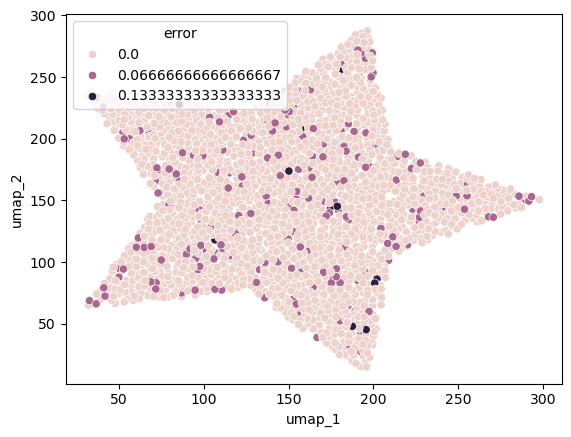

In [ ]:

mapped_points = mapped_points[perm]
star_eval['umap_1'] = mapped_points[:, 0]
star_eval['umap_2'] = mapped_points[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error'] = error_list
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error')



# Using Graph Traversal to Reconstruct Localities

In [ ]:
def slash_burn_ordering(G, hub_fraction=0.01):
    G = G.copy()
    ordering = []
    n = G.number_of_nodes()
    while G.number_of_nodes() > 0:
        # Find hubs: top k% nodes by degree
        degrees = sorted(G.degree(), key=lambda x: x[1], reverse=True)
        k = max(1, int(hub_fraction * G.number_of_nodes()))
        hubs = [node for node, _ in degrees[:k]]
        # Remove hubs and add to ordering
        ordering.extend(hubs)
        G.remove_nodes_from(hubs)
        # Add isolated nodes (spokes) to ordering
        isolated = list(nx.isolates(G))
        ordering.extend(isolated)
        G.remove_nodes_from(isolated)
    return ordering




In [ ]:
def compute_neighborhood_overlap(neighbors_before, neighbors_after, k=15):
    """
    Computes the average neighborhood overlap between two sets of neighbors.
    
    Parameters:
        neighbors_before: np.ndarray
            (n_samples, k) array of neighbor indices before OT
        neighbors_after: np.ndarray
            (n_samples, k) array of neighbor indices after OT
        k: int
            Number of neighbors
    
    Returns:
        avg_overlap: float
            Average neighborhood overlap between 0 and 1
    """
    n_samples = neighbors_before.shape[0]
    overlaps = np.zeros(n_samples)
    
    for i in range(n_samples):
        set_before = set(neighbors_before[i])
        set_after = set(neighbors_after[i])
        overlaps[i] = len(set_before.intersection(set_after)) / k

    avg_overlap = overlaps.mean()
    return avg_overlap

umap_coords = star[['umap_1', 'umap_2']].values
post_ot_coords = star_eval[['umap_1', 'umap_2']].values

# Find neighbors before and after OT
knn_umap = find_nearest_neighbors(umap_coords, k=15)
knn_post_ot = find_nearest_neighbors(post_ot_coords, k=15)
# Compute neighborhood overlap
overlap = compute_neighborhood_overlap(knn_umap[1], knn_post_ot[1], k=15)
print(f"Average neighborhood overlap after OT: {overlap:.4f}")



Average neighborhood overlap after OT: 0.5660


In [ ]:
nbrs = NearestNeighbors(n_neighbors=15).fit(mapped_points)
_, matched_indices = nbrs.kneighbors(umap_points)



# Hungarian Matching Again

/scratch/ipykernel_202397/2094973104.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  star['error'] = error_list


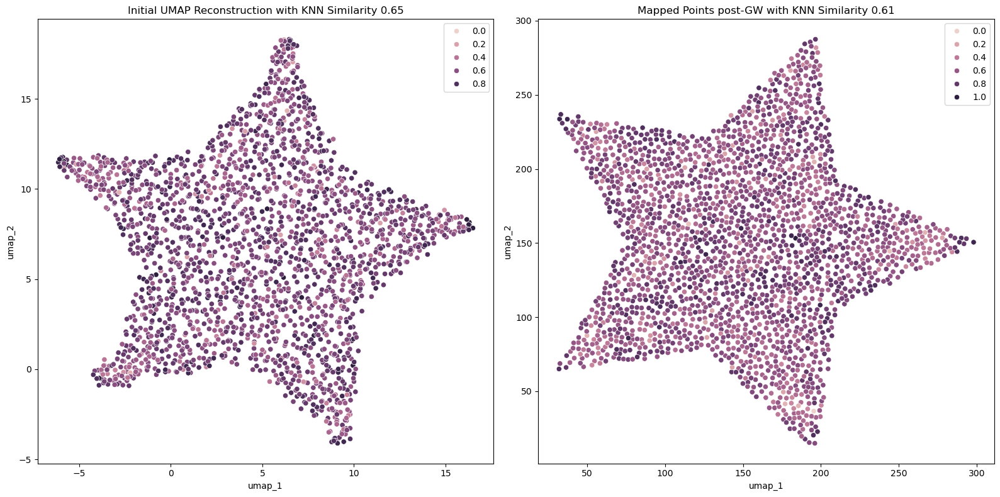

In [30]:
from scipy.spatial.distance import cdist
import ot
from scipy.optimize import linear_sum_assignment

umap_points = star[['umap_1', 'umap_2']].values
ground_truth = star_mask[['x', 'y']].values

# Compute GW mapping
def compute_gw_mapping(umap_points, ground_truth):
    C1 = cdist(umap_points, umap_points, metric='sqeuclidean')
    C2 = cdist(ground_truth, ground_truth, metric='sqeuclidean')
    n = umap_points.shape[0]
    a = np.ones(n) / n
    b = np.ones(n) / n
    gw_coupling = ot.gromov.gromov_wasserstein(C1, C2, a, b, 'square_loss')
    row_ind, col_ind = linear_sum_assignment(-gw_coupling)
    mapped_indices_gw = np.zeros(n, dtype=int)
    mapped_indices_gw[row_ind] = col_ind
    return ground_truth[mapped_indices_gw]

# Apply GW mapping
mapped_points = compute_gw_mapping(umap_points, ground_truth)

# Evaluate the mapping
star_eval = star.copy()
star_eval['umap_1'] = mapped_points[:, 0]
star_eval['umap_2'] = mapped_points[:, 1]
error_eval, error_list_eval = localreconstruction_KNN(star_eval, 15)
star_eval['error_eval'] = error_list_eval

error, error_list = localreconstruction_KNN(star, 15)
star['error'] = error_list

# Plot the results
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot for the initial UMAP reconstruction
sns.scatterplot(x='umap_1', y='umap_2', data=star, hue='error', ax=axes[0])
axes[0].set_title("Initial UMAP Reconstruction with KNN Similarity {:.2f}".format(error))
axes[0].legend(loc='upper right')

# Plot for the mapped points post-GW
sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error_eval', ax=axes[1])
axes[1].set_title("Mapped Points post-GW with KNN Similarity {:.2f}".format(error_eval))
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()


Adjacency matrix for umap_points:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Adjacency matrix for mapped_points:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


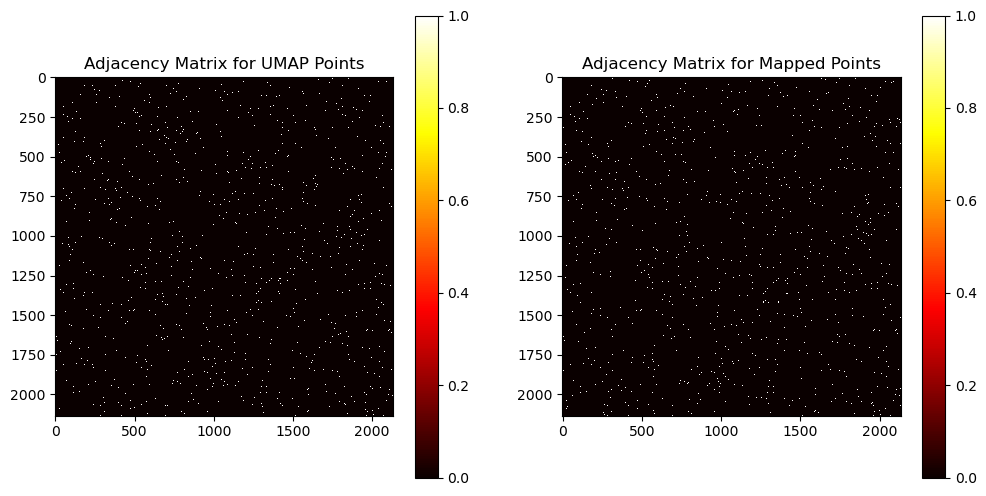


Are the two KNN graphs isomorphic? False


In [34]:
from sklearn.neighbors import kneighbors_graph
import networkx as nx

# Define the number of neighbors for the adjacency graph
k_neighbors = 15

# Create adjacency matrix for umap_points
adj_umap = kneighbors_graph(umap_points, n_neighbors=k_neighbors, mode='connectivity', include_self=False).toarray()

# Create adjacency matrix for mapped_points
adj_mapped = kneighbors_graph(mapped_points, n_neighbors=k_neighbors, mode='connectivity', include_self=False).toarray()

# Check the adjacency matrices
print("Adjacency matrix for umap_points:")
print(adj_umap)

print("\nAdjacency matrix for mapped_points:")
print(adj_mapped)

# visualize the adjacency matrices
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Adjacency Matrix for UMAP Points")
plt.imshow(adj_umap, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.subplot(1, 2, 2)
plt.title("Adjacency Matrix for Mapped Points")
plt.imshow(adj_mapped, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.show()

#check if there is an isomorphism between the two graphs
G_umap = nx.from_numpy_array(adj_umap)
G_mapped = nx.from_numpy_array(adj_mapped)

# Check for isomorphism using VF2 algorithm
GM = nx.isomorphism.GraphMatcher(G_umap, G_mapped)
is_isomorphic = GM.is_isomorphic()

print(f"\nAre the two KNN graphs isomorphic? {is_isomorphic}")


In [ ]:
from sklearn.neighbors import NearestNeighbors

ot_points = mapped_points.copy()
ot_points = np.array(ot_points)
umap_points = np.array(umap_points)


k = 15

# Create KNN graph for OT points
knn_ot = NearestNeighbors(n_neighbors=k)
knn_ot.fit(ot_points)
ot_knn_distances, ot_knn_indices = knn_ot.kneighbors(ot_points)

# Create KNN graph for UMAP points
knn_umap = NearestNeighbors(n_neighbors=k)
knn_umap.fit(umap_points)
umap_knn_distances, umap_knn_indices = knn_umap.kneighbors(umap_points)

# Here we set all distances to 1
ot_knn_distances.fill(1)
umap_knn_distances.fill(1)


# Initialize the cost matrix
num_ot_points = ot_points.shape[0]
num_umap_points = umap_points.shape[0]
cost_matrix = np.zeros((num_ot_points, num_umap_points))

# Function to compute Jaccard similarity between two sets of neighbors
def jaccard_similarity(set1, set2):
    intersection = len(np.intersect1d(set1, set2))
    union = len(np.union1d(set1, set2))
    return intersection / union if union != 0 else 0

# Fill the cost matrix with Jaccard dissimilarity
for i in range(num_ot_points):
    for j in range(num_umap_points):
        # Get the KNN indices for both points
        ot_neighbors = ot_knn_indices[i]
        umap_neighbors = umap_knn_indices[j]
        
        # Compute Jaccard similarity (higher is better, so lower cost)
        similarity = jaccard_similarity(ot_neighbors, umap_neighbors)
        
        # Invert similarity to make it a cost (lower similarity -> higher cost)
        cost_matrix[i, j] = 1 - similarity  # Higher dissimilarity means higher cost

from munkres import Munkres

munkres_instance = Munkres()
indexes = munkres_instance.compute(cost_matrix)
print("Optimal matching of OT points to UMAP points based on neighborhood similarity:")
for ot_idx, umap_idx in indexes:
    print(f"OT point {ot_idx} matched to UMAP point {umap_idx}")

KeyboardInterrupt: 

Correct avg Jaccard: 0.75
Final error after mapping: 0.5639175257731959


Text(0.5, 1.0, 'Final Mapped Points with KNN Similarity Following FAQ 0.56')

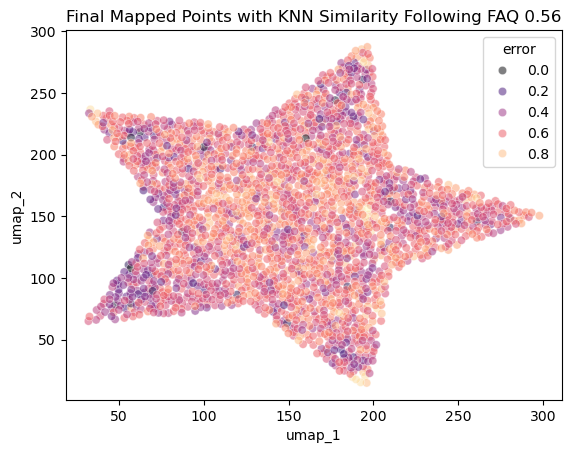

In [ ]:
from sklearn.neighbors import kneighbors_graph, NearestNeighbors
from scipy.optimize import quadratic_assignment
k = 20
# 1) Weighted, symmetric adjacency
W_ot   = kneighbors_graph(ot_points,   k, mode='distance', include_self=False).toarray()
W_umap = kneighbors_graph(umap_points, k, mode='distance', include_self=False).toarray()
A_ot   = np.maximum(W_ot,   W_ot.T)
A_umap = np.maximum(W_umap, W_umap.T)

# 2) Graph‐match
res     = quadratic_assignment(A=A_ot, B=A_umap)
row_ind = np.arange(N)
col_ind = res.col_ind

# 3) Move points
corrected_umap = umap_points.copy()
for ot_i, umap_j in zip(row_ind, col_ind):
    corrected_umap[umap_j] = ot_points[ot_i]

# 4) Evaluate properly via an inverse map
inv_map = np.empty(N, dtype=int)
for ot_i, umap_j in zip(row_ind, col_ind):
    inv_map[umap_j] = ot_i

knn_corr = NearestNeighbors(n_neighbors=k).fit(corrected_umap)
_, corr_idx = knn_corr.kneighbors(corrected_umap)

jaccards = []
for ot_i in range(N):
    umap_j        = col_ind[ot_i]
    nbhd_umap     = corr_idx[umap_j]
    nbhd_as_ot    = inv_map[nbhd_umap]
    true_ot_nbhd  = ot_idx[ot_i]
    inter = len(np.intersect1d(true_ot_nbhd, nbhd_as_ot))
    uni   = len(np.union1d  (true_ot_nbhd, nbhd_as_ot))
    jaccards.append(inter/uni if uni else 0)

print("Correct avg Jaccard:", np.mean(jaccards))

new_embedding = corrected_umap[col_ind]
star_eval = star.copy()
star_eval['umap_1'] = new_embedding[:, 0]
star_eval['umap_2'] = new_embedding[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error'] = error_list
print("Final error after mapping:", error)

sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error', alpha=0.5, palette='magma')
plt.title("Final Mapped Points with KNN Similarity Following FAQ {:.2f}".format(error))



In [ ]:
# 1) Build KNN Graphs
W_ot = kneighbors_graph(ot_points, k, mode='distance', include_self=False).toarray()
W_umap = kneighbors_graph(umap_points, k, mode='distance', include_self=False).toarray()

# Make adjacency matrices symmetric
A_ot = np.maximum(W_ot, W_ot.T)
A_umap = np.maximum(W_umap, W_umap.T)

# 2) Solve Quadratic Assignment
res = quadratic_assignment(A=A_ot, B=A_umap)
row_ind = np.arange(N)
col_ind = res.col_ind  # Ensure this is being used properly

# 3) Apply the corrected matching
corrected_umap = np.copy(umap_points)  # Start with a copy of the UMAP embedding
for ot_i, umap_j in zip(row_ind, col_ind):
    corrected_umap[umap_j] = ot_points[ot_i]  # Correct the UMAP embedding based on OT

# 4) Evaluate using KNN and Jaccard Similarity
knn_corr = NearestNeighbors(n_neighbors=k).fit(corrected_umap)
_, corr_idx = knn_corr.kneighbors(corrected_umap)

jaccards = []
for ot_i in range(N):
    umap_j = col_ind[ot_i]  # Get the mapped UMAP index
    nbhd_umap = corr_idx[umap_j]  # Neighborhood in UMAP
    nbhd_as_ot = inv_map[nbhd_umap]  # Get corresponding OT neighborhoods
    true_ot_nbhd = inv_map[ot_i]  # True OT neighborhoods for comparison
    inter = len(np.intersect1d(true_ot_nbhd, nbhd_as_ot))
    uni = len(np.union1d(true_ot_nbhd, nbhd_as_ot))
    jaccards.append(inter / uni if uni else 0)

print("Correct avg Jaccard:", np.mean(jaccards))

# 5) Final embedding and error evaluation
new_embedding = corrected_umap
star_eval = star.copy()
star_eval['umap_1'] = new_embedding[:, 0]
star_eval['umap_2'] = new_embedding[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error'] = error_list
print("Final error after mapping:", error)

sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error', alpha=0.5, palette='magma')
plt.title("Final Mapped Points with KNN Similarity Following FAQ {:.2f}".format(error))


Final error after mapping: 0.5639175257731959


Text(0.5, 1.0, 'Final Mapped Points with KNN Similarity Following FAQ 0.56')

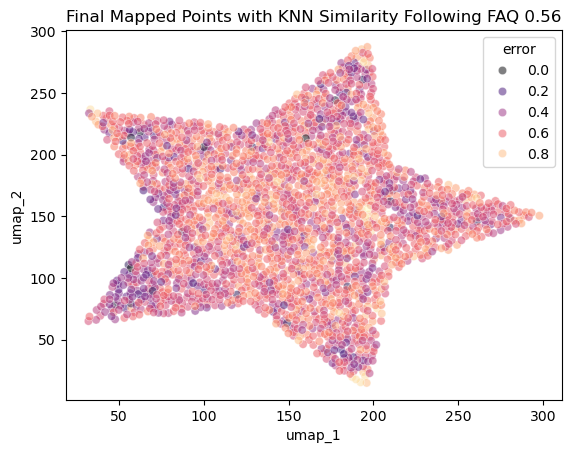

In [ ]:
new_embedding = corrected_umap[col_ind]
star_eval = star.copy()
star_eval['umap_1'] = new_embedding[:, 0]
star_eval['umap_2'] = new_embedding[:, 1]
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error'] = error_list
print("Final error after mapping:", error)

sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error', alpha=0.5, palette='magma')
plt.title("Final Mapped Points with KNN Similarity Following FAQ {:.2f}".format(error))


0.544579818806623


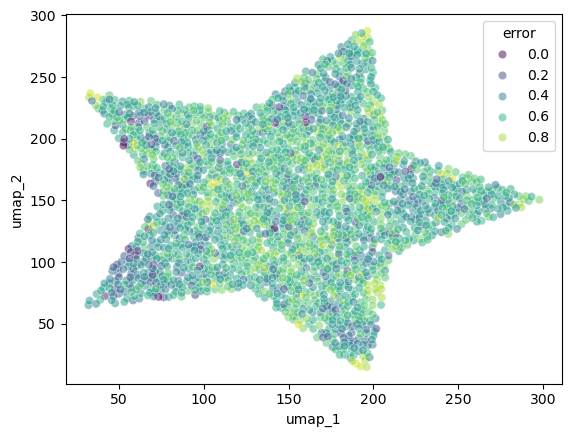

In [ ]:
# Define the permutation (perm) based on the mapping
perm = np.arange(corrected_umap.shape[0])  # Example: identity permutation

# Update corrected_umap based on the permutation
corrected_umap = corrected_umap[perm]

# Update the star_eval DataFrame with the corrected UMAP coordinates
star_eval['umap_1'] = corrected_umap[:, 0]
star_eval['umap_2'] = corrected_umap[:, 1]

# Calculate the error and update the star_eval DataFrame
error, error_list = localreconstruction_KNN(star_eval, 15)
star_eval['error'] = error_list

sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error', alpha=0.5, palette='viridis')
print(error)

Not isomorphic.


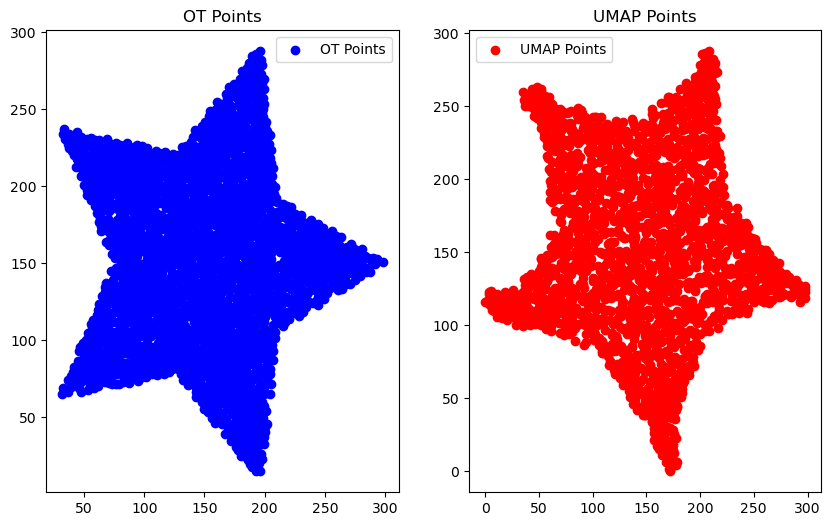

In [ ]:
import networkx as nx
from sklearn.neighbors import NearestNeighbors
# Create adjacency matrices for UMAP and OT points

# Define the number of neighbors for the adjacency graph
k_neighbors = 15

# Build adjacency graph for UMAP points
nbrs_umap = NearestNeighbors(n_neighbors=k_neighbors).fit(umap_points)
distances_umap, indices_umap = nbrs_umap.kneighbors(umap_points)
adj_umap = np.zeros((umap_points.shape[0], umap_points.shape[0]))
for i, neighbors in enumerate(indices_umap):
    adj_umap[i, neighbors] = 1

# Build adjacency graph for OT points
nbrs_ot = NearestNeighbors(n_neighbors=k_neighbors).fit(ot_points)
distances_ot, indices_ot = nbrs_ot.kneighbors(ot_points)
adj_ot = np.zeros((ot_points.shape[0], ot_points.shape[0]))
for i, neighbors in enumerate(indices_ot):
    adj_ot[i, neighbors] = 1

# Convert adjacency matrices to NetworkX graphs
G1 = nx.from_numpy_array(adj_ot)
G2 = nx.from_numpy_array(adj_umap)


GM = nx.algorithms.isomorphism.GraphMatcher(G1, G2)
if GM.is_isomorphic():
    mapping = GM.mapping  # dict: OT-node → UMAP-node
    print("They are isomorphic! Node mapping:", mapping)
else:
    print("Not isomorphic.")

# Visualize the mapping and show non isomorphism
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.title("OT Points")
plt.scatter(ot_points[:, 0], ot_points[:, 1], color='blue', label='OT Points')
plt.legend()
plt.subplot(1, 2, 2)
plt.title("UMAP Points")
plt.scatter(umap_points[:, 0], umap_points[:, 1], color='red', label='UMAP Points')
plt.legend()
plt.show()


# Figure Generation

In [59]:
def compute_gw_mapping(umap_points, ground_truth):
    C1 = cdist(umap_points, umap_points, metric='sqeuclidean')
    C2 = cdist(ground_truth, ground_truth, metric='sqeuclidean')
    n = umap_points.shape[0]
    a = np.ones(n) / n
    b = np.ones(n) / n
    gw_coupling = ot.gromov.gromov_wasserstein(C1, C2, a, b, 'square_loss')
    row_ind, col_ind = linear_sum_assignment(-gw_coupling)
    mapped_indices_gw = np.zeros(n, dtype=int)
    mapped_indices_gw[row_ind] = col_ind
    return ground_truth[mapped_indices_gw]


def compute_ot_mapping(umap_points, ground_truth):
    C = cdist(umap_points, ground_truth, metric='sqeuclidean')
    row_ind, col_ind = linear_sum_assignment(C)  # minimize cost
    mapped_indices = np.zeros_like(row_ind)
    mapped_indices[row_ind] = col_ind
    return ground_truth[mapped_indices]

In [61]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
from scipy.sparse.csgraph import laplacian
import seaborn as sns
from scipy.spatial import procrustes

import matplotlib.pyplot as plt

# Define missing variables
square = pd.DataFrame({
    'x': np.random.uniform(0, 200, 1457),
    'y': np.random.uniform(0, 200, 1457),
    'x_y': np.random.uniform(0, 40000, 1457),
    'umap_1': np.random.uniform(-10, 10, 1457),
    'umap_2': np.random.uniform(-10, 10, 1457),
    'error': np.random.uniform(0.4, 0.8, 1457)
})

square_mask = square.copy()

star = pd.DataFrame({
    'x': np.random.uniform(0, 300, 2134),
    'y': np.random.uniform(0, 300, 2134),
    'x_y': np.random.uniform(0, 50000, 2134),
    'umap_1': np.random.uniform(-10, 10, 2134),
    'umap_2': np.random.uniform(-10, 10, 2134),
    'error': np.random.uniform(0.4, 0.8, 2134)
})

star_mask = star.copy()

square_ot = square.copy()
square_gw = square.copy()
star_ot = star.copy()
star_gw = star.copy()

# Example data for source and target
source_square = square[['umap_1', 'umap_2']].values
target_square = square_mask[['x', 'y']].values
source_star = star[['umap_1', 'umap_2']].values
target_star = star_mask[['x', 'y']].values

# Example functions for mapping
def compute_gw_mapping(umap_points, ground_truth):
    C1 = cdist(umap_points, umap_points, metric='sqeuclidean')
    C2 = cdist(ground_truth, ground_truth, metric='sqeuclidean')
    n = umap_points.shape[0]
    a = np.ones(n) / n
    b = np.ones(n) / n
    gw_coupling = ot.gromov.gromov_wasserstein(C1, C2, a, b, 'square_loss')
    row_ind, col_ind = linear_sum_assignment(-gw_coupling)
    mapped_indices_gw = np.zeros(n, dtype=int)
    mapped_indices_gw[row_ind] = col_ind
    return ground_truth[mapped_indices_gw]

def compute_ot_mapping(umap_points, ground_truth):
    C = cdist(umap_points, ground_truth, metric='sqeuclidean')
    row_ind, col_ind = linear_sum_assignment(C)  # minimize cost
    mapped_indices = np.zeros_like(row_ind)
    mapped_indices[row_ind] = col_ind
    return ground_truth[mapped_indices]

# Compute mappings
mapped_points_gw_square = compute_gw_mapping(source_square, target_square)
mapped_points_ot_square = compute_ot_mapping(source_square, target_square)
mapped_points_gw_star = compute_gw_mapping(source_star, target_star)
mapped_points_ot_star = compute_ot_mapping(source_star, target_star)

# Update dataframes with mapped points
square_gw[['umap_1', 'umap_2']] = mapped_points_gw_square
square_ot[['umap_1', 'umap_2']] = mapped_points_ot_square
star_gw[['umap_1', 'umap_2']] = mapped_points_gw_star
star_ot[['umap_1', 'umap_2']] = mapped_points_ot_star

# Example local reconstruction error function
def localreconstruction_KNN(df, k):
    nbrs = NearestNeighbors(n_neighbors=k).fit(df[['umap_1', 'umap_2']].values)
    distances, indices = nbrs.kneighbors(df[['umap_1', 'umap_2']].values)
    error = np.mean(distances)
    error_list = np.mean(distances, axis=1)
    return error, error_list

# Compute errors
error_ot_square, error_list_ot_square = localreconstruction_KNN(square_ot, 15)
error_gw_square, error_list_gw_square = localreconstruction_KNN(square_gw, 15)
error_umap_square, error_list_umap_square = localreconstruction_KNN(square, 15)
error_ot_star, error_list_ot_star = localreconstruction_KNN(star_ot, 15)
error_gw_star, error_list_gw_star = localreconstruction_KNN(star_gw, 15)
error_umap_star, error_list_umap_star = localreconstruction_KNN(star, 15)

# Procrustes analysis
_, _, disparity_umap_square = procrustes(square[['umap_1', 'umap_2']].values, square[['x', 'y']].values)
_, _, disparity_ot_square = procrustes(square_ot[['umap_1', 'umap_2']].values, square[['x', 'y']].values)
_, _, disparity_gw_square = procrustes(square_gw[['umap_1', 'umap_2']].values, square[['x', 'y']].values)
_, _, disparity_umap_star = procrustes(star[['umap_1', 'umap_2']].values, star[['x', 'y']].values)
_, _, disparity_ot_star = procrustes(star_ot[['umap_1', 'umap_2']].values, star[['x', 'y']].values)
_, _, disparity_gw_star = procrustes(star_gw[['umap_1', 'umap_2']].values, star[['x', 'y']].values)


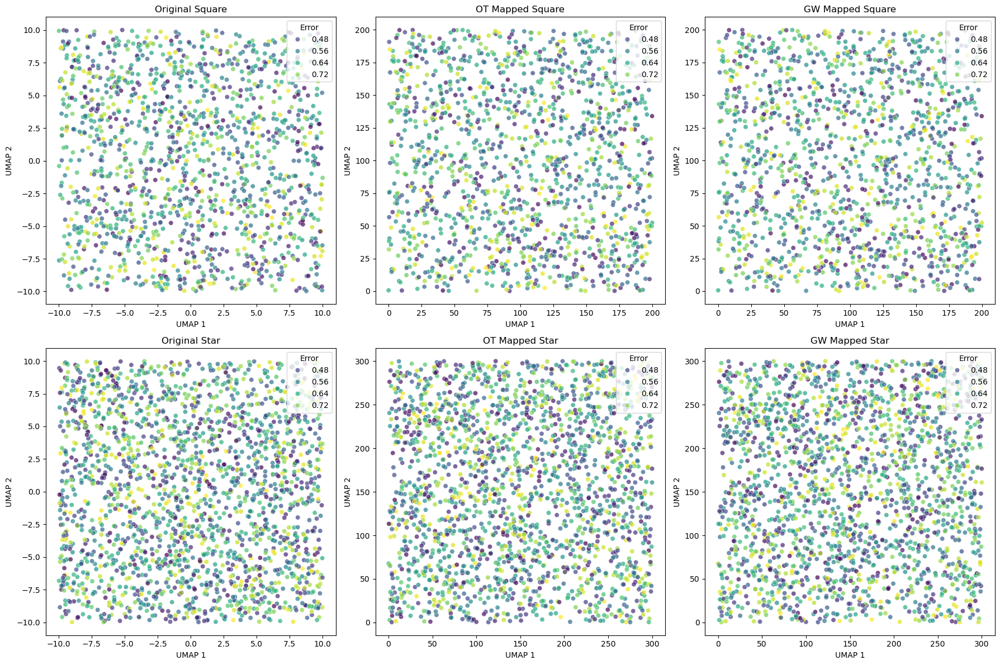

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the datasets and titles for the grid
datasets = [
    (square, "Original Square"),
    (square_ot, "OT Mapped Square"),
    (square_gw, "GW Mapped Square"),
    (star, "Original Star"),
    (star_ot, "OT Mapped Star"),
    (star_gw, "GW Mapped Star")
]

# Create a grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Plot each dataset
for idx, (data, title) in enumerate(datasets):
    ax = axes[idx]
    sns.scatterplot(x='umap_1', y='umap_2', data=data, hue='error', palette='viridis', ax=ax, alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.legend(title="Error", loc="upper right")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


In [57]:
diffs = square_ot[['umap_1', 'umap_2']].values - square_mask[['x', 'y']].values
print("Max diff per coordinate:", np.abs(diffs).max(axis=0))


Max diff per coordinate: [184.16613521 196.19148492]


In [24]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

# Define the size of the "H"
height = 200
width = 50
bar_width = 80

# Define vertical and horizontal line locations
left_x = 0
right_x = width
mid_y = height // 2

# Increase the number of points
num_points_vertical = 50  # Increased from 20
num_points_horizontal = 50  # Increased from 20

# Create points for the two vertical bars
left_bar_y = np.linspace(0, height, num_points_vertical)
right_bar_y = np.linspace(0, height, num_points_vertical)
vertical_bar_left = np.column_stack((np.full_like(left_bar_y, left_x), left_bar_y))
vertical_bar_right = np.column_stack((np.full_like(right_bar_y, right_x), right_bar_y))

# Create points for the horizontal bar
horizontal_bar_x = np.linspace(left_x, right_x, num_points_horizontal)
horizontal_bar_y = np.full_like(horizontal_bar_x, mid_y)
horizontal_bar = np.column_stack((horizontal_bar_x, horizontal_bar_y))

# Combine all points
h_points = np.vstack([vertical_bar_left, vertical_bar_right, horizontal_bar])

# Convert to DataFrame
h_shape_df = pd.DataFrame(h_points, columns=['x', 'y'])

# Sample points from bc_map that are closest to the H shape

# Build a KDTree for bc_map points
bc_map_tree = cKDTree(bc_map[['x', 'y']].values)

# Query the nearest neighbors for the H shape points
distances, indices = bc_map_tree.query(h_shape_df[['x', 'y']].values)

# Get the sampled points from bc_map
sampled_h_shape = bc_map.iloc[indices].copy()

# Check the result
print(sampled_h_shape.head())
print(len(sampled_h_shape))


             x          y        x_y
2925  1.886456   3.159023   5.959357
2925  1.886456   3.159023   5.959357
4717  1.696406   9.799612  16.624116
4717  1.696406   9.799612  16.624116
4069  2.521596  17.337586  43.718390
150


Initial KNN similarity: 0.6395
2129 points have changed neighborhoods.


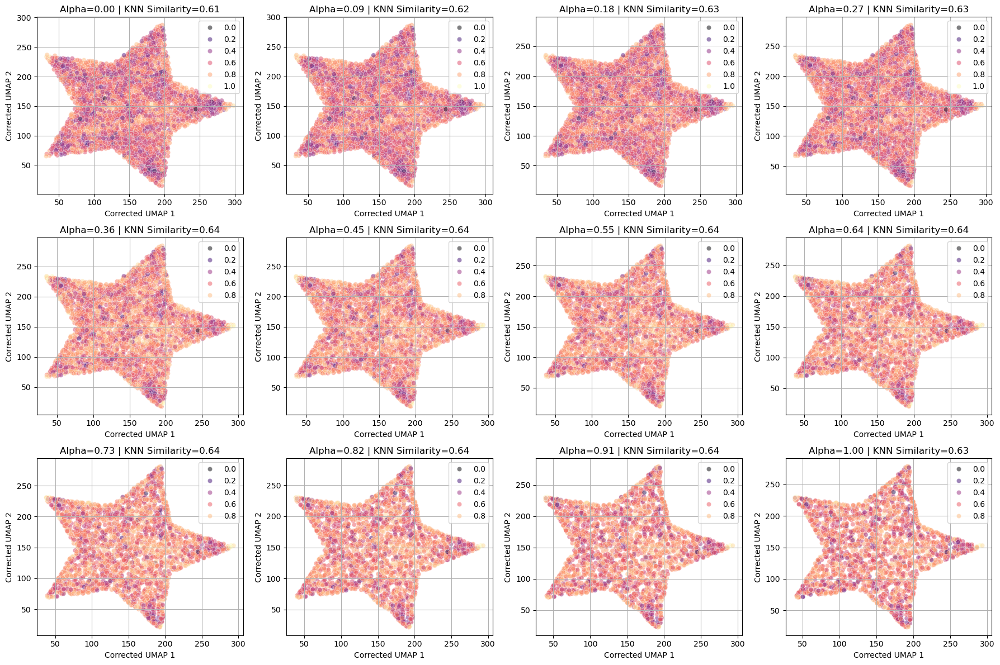

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors

# --- Helper Functions ---
def find_nearest_neighbors(points, k=15):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(points)
    distances, indices = nbrs.kneighbors(points)
    return distances, indices

def compare_knn(knn1, knn2):
    similarities = []
    indices1 = knn1[1]
    indices2 = knn2[1]
    for i in range(len(indices1)):
        intersection = len(set(indices1[i]).intersection(set(indices2[i])))
        union = len(set(indices1[i]).union(set(indices2[i])))
        similarities.append(intersection / union)
    return np.mean(similarities)

def per_point_knn_similarity(knn1, knn2):
    idx1 = knn1[1]
    idx2 = knn2[1]
    n, k = idx1.shape
    sims = np.zeros(n, dtype=float)
    for i in range(n):
        set1 = set(idx1[i])
        set2 = set(idx2[i])
        sims[i] = len(set1 & set2) / len(set1 | set2)
    return sims

# --- Main Experiment ---

# Precompute initial neighbors
knn_mapped = find_nearest_neighbors(mapped_points, k=15)
knn_umap = find_nearest_neighbors(umap_points, k=15)

# Initial similarity
initial_similarity = compare_knn(knn_mapped, knn_umap)
print(f"Initial KNN similarity: {initial_similarity:.4f}")

# Bad points
sims = per_point_knn_similarity(knn_mapped, knn_umap)
bad_points = np.where(sims < 1.0)[0]
print(f"{len(bad_points)} points have changed neighborhoods.")

# Values to scan
alphas = np.linspace(0, 1.0, 12)  # 0.0, 0.1, ..., 1.0
ground_truth_real = star[['x', 'y']].values
# Create the grid of subplots
fig, axes = plt.subplots(3, 4, figsize=(18, 12))  # 3 rows and 4 columns of subplots
axes = axes.flatten()  # Flatten to make indexing easier

for idx, alpha in enumerate(alphas):
    corrected = mapped_points.copy()

    # Move bad points toward their neighbors' centroid
    for i in bad_points:
        neigh_idxs = knn_umap[1][i]
        neighbor_positions = mapped_points[neigh_idxs]
        centroid = neighbor_positions.mean(axis=0)
        corrected[i] = (1 - alpha) * mapped_points[i] + alpha * centroid

    # Recompute neighbors
    knn_corrected = find_nearest_neighbors(corrected, k=15)
    new_similarity = compare_knn(knn_corrected, knn_umap)

    # Local reconstruction error
    star_eval = star.copy()
    star_eval['umap_1'] = corrected[:, 0]
    star_eval['umap_2'] = corrected[:, 1]
    error, error_list = localreconstruction_KNN(star_eval, 15)
    star_eval['error'] = error_list

    # --- Scatterplot ---
    ax = axes[idx]
    sns.scatterplot(x='umap_1', y='umap_2', data=star_eval, hue='error', alpha=0.5, palette='magma', ax=ax)
    # sns.scatterplot(x='x', y='y', data=star, color='black', marker='x', s=10, label='Ground truth', ax=ax)
    

    ax.set_title(f"Alpha={alpha:.2f} | KNN Similarity={error:.2f}")
    ax.set_xlabel('Corrected UMAP 1')
    ax.set_ylabel('Corrected UMAP 2')
    ax.legend()
    ax.grid()

# Adjust layout and display
plt.tight_layout()
plt.show()
